# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 1000
dtc_w2 = 100

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: z4zlwgwq
Name: super-voice-627
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/z4zlwgwq
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_140459-z4zlwgwq/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 224,380,434,196,395,302,550,140,462,379,420,377,241,287,46,210,447,283,287,533,258,271,157,51,343,144,109,302,104,83,184,196,49,327,223,167,259,145,102,196,361,454,317,987,138,378,160,194,280,323,234,136,366,259,264,372,311,642,318,290,227,577,239,149,266,330,291,730,356,349,263,349,373,366,127,231,213,149,51,130,203,510,305,262,325,224,142,237,379,168,137,104,278,401,154,160,422,78,159,266,167,381,96,249,195,216,317,139,149,292,275,116,108,368,345,357,264,49,46,194,226,265,70,203,315,257,184,232,289,215,936,265,194,521,302,166,494,344,514,475,212,458,458,276,363,232,355,241,282,283,274,252,243,436,388,250,241,197,153,600,257,241,145,148,164,159,518,245,386,218,260,408,594,399,291,254,234,234,174,178,211,190,211,242,610,322,330,362,363,7110,422,279,193,164,355,174,263,273,168,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 52,101,124,36,100,77,137,35,120,84,113,87,60,71,13,54,115,82,61,130,48,64,31,13,67,40,25,62,22,24,46,49,15,85,63,44,72,35,12,41,107,112,98,232,41,97,55,47,75,75,51,42,104,69,65,106,76,145,64,76,63,154,58,34,56,95,63,175,85,96,61,110,78,79,32,53,64,42,20,21,44,120,77,83,101,48,50,58,100,48,38,26,51,93,38,40,130,18,34,102,48,82,30,54,42,58,93,28,34,76,74,24,33,77,82,87,63,5,13,72,52,64,26,51,80,54,53,66,72,48,261,72,47,126,73,26,129,88,112,106,49,113,121,62,88,68,89,61,81,83,65,50,76,64,109,63,57,40,39,170,53,52,31,38,51,43,149,70,94,51,85,104,156,114,81,68,50,57,44,44,53,46,44,63,153,112,82,84,100,1797,108,70,52,47,91,43,68,59,32,72,40,68,53,73,54,116,60,69,98,25,13,52,62,65,21,61,70,90,45,50,91,57,51,65,41,54,56,95,60,71,65,120,56,65,17,44,36,132,116,114,86,63,77,54,208,97,20

Epoch 1/1000:   0%|          | 1/1000 [00:17<4:50:01, 17.42s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:17<4:50:01, 17.42s/it, v_num=wq_1, total_loss_train=1.45e+3, kl_local_train=102]

Epoch 2/1000:   0%|          | 1/1000 [00:17<4:50:01, 17.42s/it, v_num=wq_1, total_loss_train=1.45e+3, kl_local_train=102]

Epoch 2/1000:   0%|          | 2/1000 [00:24<3:06:17, 11.20s/it, v_num=wq_1, total_loss_train=1.45e+3, kl_local_train=102]

Epoch 2/1000:   0%|          | 2/1000 [00:24<3:06:17, 11.20s/it, v_num=wq_1, total_loss_train=1.3e+3, kl_local_train=51.1]

Epoch 3/1000:   0%|          | 2/1000 [00:24<3:06:17, 11.20s/it, v_num=wq_1, total_loss_train=1.3e+3, kl_local_train=51.1]

Epoch 3/1000:   0%|          | 3/1000 [00:31<2:33:18,  9.23s/it, v_num=wq_1, total_loss_train=1.3e+3, kl_local_train=51.1]

Epoch 3/1000:   0%|          | 3/1000 [00:31<2:33:18,  9.23s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=4.36]

Epoch 4/1000:   0%|          | 3/1000 [00:31<2:33:18,  9.23s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=4.36]

Epoch 4/1000:   0%|          | 4/1000 [00:37<2:17:36,  8.29s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=4.36]

Epoch 4/1000:   0%|          | 4/1000 [00:37<2:17:36,  8.29s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=1.64]

Epoch 5/1000:   0%|          | 4/1000 [00:38<2:17:36,  8.29s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=1.64]

Epoch 5/1000:   0%|          | 5/1000 [00:44<2:09:08,  7.79s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=1.64]

Epoch 5/1000:   0%|          | 5/1000 [00:44<2:09:08,  7.79s/it, v_num=wq_1, total_loss_train=1.28e+3, kl_local_train=0.92]

Epoch 6/1000:   0%|          | 5/1000 [00:44<2:09:08,  7.79s/it, v_num=wq_1, total_loss_train=1.28e+3, kl_local_train=0.92]

Epoch 6/1000:   1%|          | 6/1000 [00:51<2:03:49,  7.47s/it, v_num=wq_1, total_loss_train=1.28e+3, kl_local_train=0.92]

Epoch 6/1000:   1%|          | 6/1000 [00:51<2:03:49,  7.47s/it, v_num=wq_1, total_loss_train=1.27e+3, kl_local_train=0.627]

Epoch 7/1000:   1%|          | 6/1000 [00:51<2:03:49,  7.47s/it, v_num=wq_1, total_loss_train=1.27e+3, kl_local_train=0.627]

Epoch 7/1000:   1%|          | 7/1000 [00:58<2:00:16,  7.27s/it, v_num=wq_1, total_loss_train=1.27e+3, kl_local_train=0.627]

Epoch 7/1000:   1%|          | 7/1000 [00:58<2:00:16,  7.27s/it, v_num=wq_1, total_loss_train=1.26e+3, kl_local_train=16.3] 

Epoch 8/1000:   1%|          | 7/1000 [00:58<2:00:16,  7.27s/it, v_num=wq_1, total_loss_train=1.26e+3, kl_local_train=16.3]

Epoch 8/1000:   1%|          | 8/1000 [01:05<1:58:01,  7.14s/it, v_num=wq_1, total_loss_train=1.26e+3, kl_local_train=16.3]

Epoch 8/1000:   1%|          | 8/1000 [01:05<1:58:01,  7.14s/it, v_num=wq_1, total_loss_train=1.24e+3, kl_local_train=23.7]

Epoch 9/1000:   1%|          | 8/1000 [01:05<1:58:01,  7.14s/it, v_num=wq_1, total_loss_train=1.24e+3, kl_local_train=23.7]

Epoch 9/1000:   1%|          | 9/1000 [01:12<1:56:42,  7.07s/it, v_num=wq_1, total_loss_train=1.24e+3, kl_local_train=23.7]

Epoch 9/1000:   1%|          | 9/1000 [01:12<1:56:42,  7.07s/it, v_num=wq_1, total_loss_train=1.23e+3, kl_local_train=25.4]

Epoch 10/1000:   1%|          | 9/1000 [01:12<1:56:42,  7.07s/it, v_num=wq_1, total_loss_train=1.23e+3, kl_local_train=25.4]

Epoch 10/1000:   1%|          | 10/1000 [01:19<1:55:38,  7.01s/it, v_num=wq_1, total_loss_train=1.23e+3, kl_local_train=25.4]

Epoch 10/1000:   1%|          | 10/1000 [01:19<1:55:38,  7.01s/it, v_num=wq_1, total_loss_train=1.22e+3, kl_local_train=27.4]

Epoch 11/1000:   1%|          | 10/1000 [01:19<1:55:38,  7.01s/it, v_num=wq_1, total_loss_train=1.22e+3, kl_local_train=27.4]

Epoch 11/1000:   1%|          | 11/1000 [01:26<1:54:50,  6.97s/it, v_num=wq_1, total_loss_train=1.22e+3, kl_local_train=27.4]

Epoch 11/1000:   1%|          | 11/1000 [01:26<1:54:50,  6.97s/it, v_num=wq_1, total_loss_train=1.2e+3, kl_local_train=29.7] 

Epoch 12/1000:   1%|          | 11/1000 [01:26<1:54:50,  6.97s/it, v_num=wq_1, total_loss_train=1.2e+3, kl_local_train=29.7]

Epoch 12/1000:   1%|          | 12/1000 [01:32<1:54:12,  6.94s/it, v_num=wq_1, total_loss_train=1.2e+3, kl_local_train=29.7]

Epoch 12/1000:   1%|          | 12/1000 [01:32<1:54:12,  6.94s/it, v_num=wq_1, total_loss_train=1.2e+3, kl_local_train=27.9]

Epoch 13/1000:   1%|          | 12/1000 [01:32<1:54:12,  6.94s/it, v_num=wq_1, total_loss_train=1.2e+3, kl_local_train=27.9]

Epoch 13/1000:   1%|▏         | 13/1000 [01:39<1:53:48,  6.92s/it, v_num=wq_1, total_loss_train=1.2e+3, kl_local_train=27.9]

Epoch 13/1000:   1%|▏         | 13/1000 [01:39<1:53:48,  6.92s/it, v_num=wq_1, total_loss_train=1.19e+3, kl_local_train=29.6]

Epoch 14/1000:   1%|▏         | 13/1000 [01:39<1:53:48,  6.92s/it, v_num=wq_1, total_loss_train=1.19e+3, kl_local_train=29.6]

Epoch 14/1000:   1%|▏         | 14/1000 [01:46<1:53:35,  6.91s/it, v_num=wq_1, total_loss_train=1.19e+3, kl_local_train=29.6]

Epoch 14/1000:   1%|▏         | 14/1000 [01:46<1:53:35,  6.91s/it, v_num=wq_1, total_loss_train=1.21e+3, kl_local_train=38.1]

Epoch 15/1000:   1%|▏         | 14/1000 [01:46<1:53:35,  6.91s/it, v_num=wq_1, total_loss_train=1.21e+3, kl_local_train=38.1]

Epoch 15/1000:   2%|▏         | 15/1000 [01:53<1:53:21,  6.91s/it, v_num=wq_1, total_loss_train=1.21e+3, kl_local_train=38.1]

Epoch 15/1000:   2%|▏         | 15/1000 [01:53<1:53:21,  6.91s/it, v_num=wq_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 16/1000:   2%|▏         | 15/1000 [01:53<1:53:21,  6.91s/it, v_num=wq_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 16/1000:   2%|▏         | 16/1000 [02:00<1:53:06,  6.90s/it, v_num=wq_1, total_loss_train=1.24e+3, kl_local_train=55.7]

Epoch 16/1000:   2%|▏         | 16/1000 [02:00<1:53:06,  6.90s/it, v_num=wq_1, total_loss_train=1.26e+3, kl_local_train=72.8]

Epoch 17/1000:   2%|▏         | 16/1000 [02:00<1:53:06,  6.90s/it, v_num=wq_1, total_loss_train=1.26e+3, kl_local_train=72.8]

Epoch 17/1000:   2%|▏         | 17/1000 [02:07<1:52:52,  6.89s/it, v_num=wq_1, total_loss_train=1.26e+3, kl_local_train=72.8]

Epoch 17/1000:   2%|▏         | 17/1000 [02:07<1:52:52,  6.89s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=94.4]

Epoch 18/1000:   2%|▏         | 17/1000 [02:07<1:52:52,  6.89s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=94.4]

Epoch 18/1000:   2%|▏         | 18/1000 [02:14<1:52:44,  6.89s/it, v_num=wq_1, total_loss_train=1.29e+3, kl_local_train=94.4]

Epoch 18/1000:   2%|▏         | 18/1000 [02:14<1:52:44,  6.89s/it, v_num=wq_1, total_loss_train=1.31e+3, kl_local_train=113] 

Epoch 19/1000:   2%|▏         | 18/1000 [02:14<1:52:44,  6.89s/it, v_num=wq_1, total_loss_train=1.31e+3, kl_local_train=113]

Epoch 19/1000:   2%|▏         | 19/1000 [02:21<1:52:58,  6.91s/it, v_num=wq_1, total_loss_train=1.31e+3, kl_local_train=113]

Epoch 19/1000:   2%|▏         | 19/1000 [02:21<1:52:58,  6.91s/it, v_num=wq_1, total_loss_train=1.34e+3, kl_local_train=120]

Epoch 20/1000:   2%|▏         | 19/1000 [02:21<1:52:58,  6.91s/it, v_num=wq_1, total_loss_train=1.34e+3, kl_local_train=120]

Epoch 20/1000:   2%|▏         | 20/1000 [02:28<1:52:44,  6.90s/it, v_num=wq_1, total_loss_train=1.34e+3, kl_local_train=120]

Epoch 20/1000:   2%|▏         | 20/1000 [02:28<1:52:44,  6.90s/it, v_num=wq_1, total_loss_train=1.36e+3, kl_local_train=143]

Epoch 21/1000:   2%|▏         | 20/1000 [02:28<1:52:44,  6.90s/it, v_num=wq_1, total_loss_train=1.36e+3, kl_local_train=143]

Epoch 21/1000:   2%|▏         | 21/1000 [02:35<1:52:34,  6.90s/it, v_num=wq_1, total_loss_train=1.36e+3, kl_local_train=143]

Epoch 21/1000:   2%|▏         | 21/1000 [02:35<1:52:34,  6.90s/it, v_num=wq_1, total_loss_train=1.39e+3, kl_local_train=158]

Epoch 22/1000:   2%|▏         | 21/1000 [02:35<1:52:34,  6.90s/it, v_num=wq_1, total_loss_train=1.39e+3, kl_local_train=158]

Epoch 22/1000:   2%|▏         | 22/1000 [02:41<1:52:20,  6.89s/it, v_num=wq_1, total_loss_train=1.39e+3, kl_local_train=158]

Epoch 22/1000:   2%|▏         | 22/1000 [02:41<1:52:20,  6.89s/it, v_num=wq_1, total_loss_train=1.41e+3, kl_local_train=173]

Epoch 23/1000:   2%|▏         | 22/1000 [02:41<1:52:20,  6.89s/it, v_num=wq_1, total_loss_train=1.41e+3, kl_local_train=173]

Epoch 23/1000:   2%|▏         | 23/1000 [02:48<1:52:04,  6.88s/it, v_num=wq_1, total_loss_train=1.41e+3, kl_local_train=173]

Epoch 23/1000:   2%|▏         | 23/1000 [02:48<1:52:04,  6.88s/it, v_num=wq_1, total_loss_train=1.44e+3, kl_local_train=168]

Epoch 24/1000:   2%|▏         | 23/1000 [02:48<1:52:04,  6.88s/it, v_num=wq_1, total_loss_train=1.44e+3, kl_local_train=168]

Epoch 24/1000:   2%|▏         | 24/1000 [02:55<1:51:55,  6.88s/it, v_num=wq_1, total_loss_train=1.44e+3, kl_local_train=168]

Epoch 24/1000:   2%|▏         | 24/1000 [02:55<1:51:55,  6.88s/it, v_num=wq_1, total_loss_train=1.46e+3, kl_local_train=172]

Epoch 25/1000:   2%|▏         | 24/1000 [02:55<1:51:55,  6.88s/it, v_num=wq_1, total_loss_train=1.46e+3, kl_local_train=172]

Epoch 25/1000:   2%|▎         | 25/1000 [03:02<1:51:58,  6.89s/it, v_num=wq_1, total_loss_train=1.46e+3, kl_local_train=172]

Epoch 25/1000:   2%|▎         | 25/1000 [03:02<1:51:58,  6.89s/it, v_num=wq_1, total_loss_train=1.49e+3, kl_local_train=175]

Epoch 26/1000:   2%|▎         | 25/1000 [03:02<1:51:58,  6.89s/it, v_num=wq_1, total_loss_train=1.49e+3, kl_local_train=175]

Epoch 26/1000:   3%|▎         | 26/1000 [03:09<1:51:45,  6.88s/it, v_num=wq_1, total_loss_train=1.49e+3, kl_local_train=175]

Epoch 26/1000:   3%|▎         | 26/1000 [03:09<1:51:45,  6.88s/it, v_num=wq_1, total_loss_train=1.52e+3, kl_local_train=202]

Epoch 27/1000:   3%|▎         | 26/1000 [03:09<1:51:45,  6.88s/it, v_num=wq_1, total_loss_train=1.52e+3, kl_local_train=202]

Epoch 27/1000:   3%|▎         | 27/1000 [03:16<1:51:35,  6.88s/it, v_num=wq_1, total_loss_train=1.52e+3, kl_local_train=202]

Epoch 27/1000:   3%|▎         | 27/1000 [03:16<1:51:35,  6.88s/it, v_num=wq_1, total_loss_train=1.54e+3, kl_local_train=208]

Epoch 28/1000:   3%|▎         | 27/1000 [03:16<1:51:35,  6.88s/it, v_num=wq_1, total_loss_train=1.54e+3, kl_local_train=208]

Epoch 28/1000:   3%|▎         | 28/1000 [03:23<1:51:31,  6.88s/it, v_num=wq_1, total_loss_train=1.54e+3, kl_local_train=208]

Epoch 28/1000:   3%|▎         | 28/1000 [03:23<1:51:31,  6.88s/it, v_num=wq_1, total_loss_train=1.57e+3, kl_local_train=215]

Epoch 29/1000:   3%|▎         | 28/1000 [03:23<1:51:31,  6.88s/it, v_num=wq_1, total_loss_train=1.57e+3, kl_local_train=215]

Epoch 29/1000:   3%|▎         | 29/1000 [03:30<1:51:26,  6.89s/it, v_num=wq_1, total_loss_train=1.57e+3, kl_local_train=215]

Epoch 29/1000:   3%|▎         | 29/1000 [03:30<1:51:26,  6.89s/it, v_num=wq_1, total_loss_train=1.59e+3, kl_local_train=205]

Epoch 30/1000:   3%|▎         | 29/1000 [03:30<1:51:26,  6.89s/it, v_num=wq_1, total_loss_train=1.59e+3, kl_local_train=205]

Epoch 30/1000:   3%|▎         | 30/1000 [03:36<1:51:12,  6.88s/it, v_num=wq_1, total_loss_train=1.59e+3, kl_local_train=205]

Epoch 30/1000:   3%|▎         | 30/1000 [03:36<1:51:12,  6.88s/it, v_num=wq_1, total_loss_train=1.62e+3, kl_local_train=221]

Epoch 31/1000:   3%|▎         | 30/1000 [03:36<1:51:12,  6.88s/it, v_num=wq_1, total_loss_train=1.62e+3, kl_local_train=221]

Epoch 31/1000:   3%|▎         | 31/1000 [03:43<1:51:03,  6.88s/it, v_num=wq_1, total_loss_train=1.62e+3, kl_local_train=221]

Epoch 31/1000:   3%|▎         | 31/1000 [03:43<1:51:03,  6.88s/it, v_num=wq_1, total_loss_train=1.65e+3, kl_local_train=226]

Epoch 32/1000:   3%|▎         | 31/1000 [03:43<1:51:03,  6.88s/it, v_num=wq_1, total_loss_train=1.65e+3, kl_local_train=226]

Epoch 32/1000:   3%|▎         | 32/1000 [03:50<1:50:55,  6.88s/it, v_num=wq_1, total_loss_train=1.65e+3, kl_local_train=226]

Epoch 32/1000:   3%|▎         | 32/1000 [03:50<1:50:55,  6.88s/it, v_num=wq_1, total_loss_train=1.67e+3, kl_local_train=254]

Epoch 33/1000:   3%|▎         | 32/1000 [03:50<1:50:55,  6.88s/it, v_num=wq_1, total_loss_train=1.67e+3, kl_local_train=254]

Epoch 33/1000:   3%|▎         | 33/1000 [03:57<1:50:53,  6.88s/it, v_num=wq_1, total_loss_train=1.67e+3, kl_local_train=254]

Epoch 33/1000:   3%|▎         | 33/1000 [03:57<1:50:53,  6.88s/it, v_num=wq_1, total_loss_train=1.7e+3, kl_local_train=269] 

Epoch 34/1000:   3%|▎         | 33/1000 [03:57<1:50:53,  6.88s/it, v_num=wq_1, total_loss_train=1.7e+3, kl_local_train=269]

Epoch 34/1000:   3%|▎         | 34/1000 [04:04<1:50:44,  6.88s/it, v_num=wq_1, total_loss_train=1.7e+3, kl_local_train=269]

Epoch 34/1000:   3%|▎         | 34/1000 [04:04<1:50:44,  6.88s/it, v_num=wq_1, total_loss_train=1.73e+3, kl_local_train=259]

Epoch 35/1000:   3%|▎         | 34/1000 [04:04<1:50:44,  6.88s/it, v_num=wq_1, total_loss_train=1.73e+3, kl_local_train=259]

Epoch 35/1000:   4%|▎         | 35/1000 [04:11<1:50:42,  6.88s/it, v_num=wq_1, total_loss_train=1.73e+3, kl_local_train=259]

Epoch 35/1000:   4%|▎         | 35/1000 [04:11<1:50:42,  6.88s/it, v_num=wq_1, total_loss_train=1.75e+3, kl_local_train=263]

Epoch 36/1000:   4%|▎         | 35/1000 [04:11<1:50:42,  6.88s/it, v_num=wq_1, total_loss_train=1.75e+3, kl_local_train=263]

Epoch 36/1000:   4%|▎         | 36/1000 [04:18<1:50:38,  6.89s/it, v_num=wq_1, total_loss_train=1.75e+3, kl_local_train=263]

Epoch 36/1000:   4%|▎         | 36/1000 [04:18<1:50:38,  6.89s/it, v_num=wq_1, total_loss_train=1.78e+3, kl_local_train=260]

Epoch 37/1000:   4%|▎         | 36/1000 [04:18<1:50:38,  6.89s/it, v_num=wq_1, total_loss_train=1.78e+3, kl_local_train=260]

Epoch 37/1000:   4%|▎         | 37/1000 [04:25<1:50:26,  6.88s/it, v_num=wq_1, total_loss_train=1.78e+3, kl_local_train=260]

Epoch 37/1000:   4%|▎         | 37/1000 [04:25<1:50:26,  6.88s/it, v_num=wq_1, total_loss_train=1.8e+3, kl_local_train=245] 

Epoch 38/1000:   4%|▎         | 37/1000 [04:25<1:50:26,  6.88s/it, v_num=wq_1, total_loss_train=1.8e+3, kl_local_train=245]

Epoch 38/1000:   4%|▍         | 38/1000 [04:31<1:50:18,  6.88s/it, v_num=wq_1, total_loss_train=1.8e+3, kl_local_train=245]

Epoch 38/1000:   4%|▍         | 38/1000 [04:31<1:50:18,  6.88s/it, v_num=wq_1, total_loss_train=1.83e+3, kl_local_train=254]

Epoch 39/1000:   4%|▍         | 38/1000 [04:31<1:50:18,  6.88s/it, v_num=wq_1, total_loss_train=1.83e+3, kl_local_train=254]

Epoch 39/1000:   4%|▍         | 39/1000 [04:38<1:50:27,  6.90s/it, v_num=wq_1, total_loss_train=1.83e+3, kl_local_train=254]

Epoch 39/1000:   4%|▍         | 39/1000 [04:38<1:50:27,  6.90s/it, v_num=wq_1, total_loss_train=1.85e+3, kl_local_train=243]

Epoch 40/1000:   4%|▍         | 39/1000 [04:38<1:50:27,  6.90s/it, v_num=wq_1, total_loss_train=1.85e+3, kl_local_train=243]

Epoch 40/1000:   4%|▍         | 40/1000 [04:45<1:50:46,  6.92s/it, v_num=wq_1, total_loss_train=1.85e+3, kl_local_train=243]

Epoch 40/1000:   4%|▍         | 40/1000 [04:45<1:50:46,  6.92s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=250]

Epoch 41/1000:   4%|▍         | 40/1000 [04:45<1:50:46,  6.92s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=250]

Epoch 41/1000:   4%|▍         | 41/1000 [04:52<1:50:34,  6.92s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=250]

Epoch 41/1000:   4%|▍         | 41/1000 [04:52<1:50:34,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=241]

Epoch 42/1000:   4%|▍         | 41/1000 [04:52<1:50:34,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=241]

Epoch 42/1000:   4%|▍         | 42/1000 [05:00<1:55:00,  7.20s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=241]

Epoch 42/1000:   4%|▍         | 42/1000 [05:00<1:55:00,  7.20s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=249]

Epoch 43/1000:   4%|▍         | 42/1000 [05:00<1:55:00,  7.20s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=249]

Epoch 43/1000:   4%|▍         | 43/1000 [05:07<1:54:37,  7.19s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=249]

Epoch 43/1000:   4%|▍         | 43/1000 [05:07<1:54:37,  7.19s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=253]

Epoch 44/1000:   4%|▍         | 43/1000 [05:07<1:54:37,  7.19s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=253]

Epoch 44/1000:   4%|▍         | 44/1000 [05:14<1:53:14,  7.11s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=253]

Epoch 44/1000:   4%|▍         | 44/1000 [05:14<1:53:14,  7.11s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=252]

Epoch 45/1000:   4%|▍         | 44/1000 [05:14<1:53:14,  7.11s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=252]

Epoch 45/1000:   4%|▍         | 45/1000 [05:21<1:52:01,  7.04s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=252]

Epoch 45/1000:   4%|▍         | 45/1000 [05:21<1:52:01,  7.04s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=290]

Epoch 46/1000:   4%|▍         | 45/1000 [05:21<1:52:01,  7.04s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=290]

Epoch 46/1000:   5%|▍         | 46/1000 [05:28<1:51:15,  7.00s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=290]

Epoch 46/1000:   5%|▍         | 46/1000 [05:28<1:51:15,  7.00s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=274]

Epoch 47/1000:   5%|▍         | 46/1000 [05:28<1:51:15,  7.00s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=274]

Epoch 47/1000:   5%|▍         | 47/1000 [05:35<1:50:35,  6.96s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=274]

Epoch 47/1000:   5%|▍         | 47/1000 [05:35<1:50:35,  6.96s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=262]

Epoch 48/1000:   5%|▍         | 47/1000 [05:35<1:50:35,  6.96s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=262]

Epoch 48/1000:   5%|▍         | 48/1000 [05:42<1:50:09,  6.94s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=262]

Epoch 48/1000:   5%|▍         | 48/1000 [05:42<1:50:09,  6.94s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=253]

Epoch 49/1000:   5%|▍         | 48/1000 [05:42<1:50:09,  6.94s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=253]

Epoch 49/1000:   5%|▍         | 49/1000 [05:49<1:50:10,  6.95s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=253]

Epoch 49/1000:   5%|▍         | 49/1000 [05:49<1:50:10,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=264]

Epoch 50/1000:   5%|▍         | 49/1000 [05:49<1:50:10,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=264]

Epoch 50/1000:   5%|▌         | 50/1000 [05:56<1:49:46,  6.93s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=264]

Epoch 50/1000:   5%|▌         | 50/1000 [05:56<1:49:46,  6.93s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=263]

Epoch 51/1000:   5%|▌         | 50/1000 [05:56<1:49:46,  6.93s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=263]

Epoch 51/1000:   5%|▌         | 51/1000 [06:03<1:49:21,  6.91s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=263]

Epoch 51/1000:   5%|▌         | 51/1000 [06:03<1:49:21,  6.91s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=266]

Epoch 52/1000:   5%|▌         | 51/1000 [06:03<1:49:21,  6.91s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=266]

Epoch 52/1000:   5%|▌         | 52/1000 [06:09<1:49:16,  6.92s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=266]

Epoch 52/1000:   5%|▌         | 52/1000 [06:09<1:49:16,  6.92s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=254]

Epoch 53/1000:   5%|▌         | 52/1000 [06:09<1:49:16,  6.92s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=254]

Epoch 53/1000:   5%|▌         | 53/1000 [06:16<1:49:22,  6.93s/it, v_num=wq_1, total_loss_train=2.14e+3, kl_local_train=254]

Epoch 53/1000:   5%|▌         | 53/1000 [06:16<1:49:22,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=262]

Epoch 54/1000:   5%|▌         | 53/1000 [06:16<1:49:22,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=262]

Epoch 54/1000:   5%|▌         | 54/1000 [06:23<1:49:14,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=262]

Epoch 54/1000:   5%|▌         | 54/1000 [06:23<1:49:14,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=240]

Epoch 55/1000:   5%|▌         | 54/1000 [06:23<1:49:14,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=240]

Epoch 55/1000:   6%|▌         | 55/1000 [06:30<1:49:11,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=240]

Epoch 55/1000:   6%|▌         | 55/1000 [06:30<1:49:11,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=231]

Epoch 56/1000:   6%|▌         | 55/1000 [06:30<1:49:11,  6.93s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=231]

Epoch 56/1000:   6%|▌         | 56/1000 [06:37<1:49:18,  6.95s/it, v_num=wq_1, total_loss_train=2.13e+3, kl_local_train=231]

Epoch 56/1000:   6%|▌         | 56/1000 [06:37<1:49:18,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=208]

Epoch 57/1000:   6%|▌         | 56/1000 [06:37<1:49:18,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=208]

Epoch 57/1000:   6%|▌         | 57/1000 [06:44<1:49:33,  6.97s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=208]

Epoch 57/1000:   6%|▌         | 57/1000 [06:44<1:49:33,  6.97s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=190]

Epoch 58/1000:   6%|▌         | 57/1000 [06:44<1:49:33,  6.97s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=190]

Epoch 58/1000:   6%|▌         | 58/1000 [06:51<1:49:09,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=190]

Epoch 58/1000:   6%|▌         | 58/1000 [06:51<1:49:09,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=185]

Epoch 59/1000:   6%|▌         | 58/1000 [06:51<1:49:09,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=185]

Epoch 59/1000:   6%|▌         | 59/1000 [06:58<1:48:56,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=185]

Epoch 59/1000:   6%|▌         | 59/1000 [06:58<1:48:56,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=206]

Epoch 60/1000:   6%|▌         | 59/1000 [06:58<1:48:56,  6.95s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=206]

Epoch 60/1000:   6%|▌         | 60/1000 [07:05<1:48:40,  6.94s/it, v_num=wq_1, total_loss_train=2.12e+3, kl_local_train=206]

Epoch 60/1000:   6%|▌         | 60/1000 [07:05<1:48:40,  6.94s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=188]

Epoch 61/1000:   6%|▌         | 60/1000 [07:05<1:48:40,  6.94s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=188]

Epoch 61/1000:   6%|▌         | 61/1000 [07:12<1:48:34,  6.94s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=188]

Epoch 61/1000:   6%|▌         | 61/1000 [07:12<1:48:34,  6.94s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=177]

Epoch 62/1000:   6%|▌         | 61/1000 [07:12<1:48:34,  6.94s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=177]

Epoch 62/1000:   6%|▌         | 62/1000 [07:19<1:48:45,  6.96s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=177]

Epoch 62/1000:   6%|▌         | 62/1000 [07:19<1:48:45,  6.96s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164] 

Epoch 63/1000:   6%|▌         | 62/1000 [07:19<1:48:45,  6.96s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 63/1000:   6%|▋         | 63/1000 [07:26<1:48:50,  6.97s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 63/1000:   6%|▋         | 63/1000 [07:26<1:48:50,  6.97s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=176]

Epoch 64/1000:   6%|▋         | 63/1000 [07:26<1:48:50,  6.97s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=176]

Epoch 64/1000:   6%|▋         | 64/1000 [07:33<1:48:37,  6.96s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=176]

Epoch 64/1000:   6%|▋         | 64/1000 [07:33<1:48:37,  6.96s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=183]

Epoch 65/1000:   6%|▋         | 64/1000 [07:33<1:48:37,  6.96s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=183]

Epoch 65/1000:   6%|▋         | 65/1000 [07:40<1:48:11,  6.94s/it, v_num=wq_1, total_loss_train=2.11e+3, kl_local_train=183]

Epoch 65/1000:   6%|▋         | 65/1000 [07:40<1:48:11,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=172] 

Epoch 66/1000:   6%|▋         | 65/1000 [07:40<1:48:11,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=172]

Epoch 66/1000:   7%|▋         | 66/1000 [07:47<1:48:01,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=172]

Epoch 66/1000:   7%|▋         | 66/1000 [07:47<1:48:01,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=168]

Epoch 67/1000:   7%|▋         | 66/1000 [07:47<1:48:01,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=168]

Epoch 67/1000:   7%|▋         | 67/1000 [07:54<1:47:58,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=168]

Epoch 67/1000:   7%|▋         | 67/1000 [07:54<1:47:58,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 68/1000:   7%|▋         | 67/1000 [07:54<1:47:58,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 68/1000:   7%|▋         | 68/1000 [08:01<1:47:50,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 68/1000:   7%|▋         | 68/1000 [08:01<1:47:50,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 69/1000:   7%|▋         | 68/1000 [08:01<1:47:50,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 69/1000:   7%|▋         | 69/1000 [08:08<1:47:40,  6.94s/it, v_num=wq_1, total_loss_train=2.1e+3, kl_local_train=164]

Epoch 69/1000:   7%|▋         | 69/1000 [08:08<1:47:40,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=159]

Epoch 70/1000:   7%|▋         | 69/1000 [08:08<1:47:40,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=159]

Epoch 70/1000:   7%|▋         | 70/1000 [08:15<1:47:28,  6.93s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=159]

Epoch 70/1000:   7%|▋         | 70/1000 [08:15<1:47:28,  6.93s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=142]

Epoch 71/1000:   7%|▋         | 70/1000 [08:15<1:47:28,  6.93s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=142]

Epoch 71/1000:   7%|▋         | 71/1000 [08:21<1:47:25,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=142]

Epoch 71/1000:   7%|▋         | 71/1000 [08:21<1:47:25,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=160]

Epoch 72/1000:   7%|▋         | 71/1000 [08:21<1:47:25,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=160]

Epoch 72/1000:   7%|▋         | 72/1000 [08:28<1:47:16,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=160]

Epoch 72/1000:   7%|▋         | 72/1000 [08:28<1:47:16,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=147]

Epoch 73/1000:   7%|▋         | 72/1000 [08:28<1:47:16,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=147]

Epoch 73/1000:   7%|▋         | 73/1000 [08:35<1:47:07,  6.93s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=147]

Epoch 73/1000:   7%|▋         | 73/1000 [08:35<1:47:07,  6.93s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=161]

Epoch 74/1000:   7%|▋         | 73/1000 [08:35<1:47:07,  6.93s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=161]

Epoch 74/1000:   7%|▋         | 74/1000 [08:42<1:47:04,  6.94s/it, v_num=wq_1, total_loss_train=2.09e+3, kl_local_train=161]

Epoch 74/1000:   7%|▋         | 74/1000 [08:42<1:47:04,  6.94s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=136]

Epoch 75/1000:   7%|▋         | 74/1000 [08:42<1:47:04,  6.94s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=136]

Epoch 75/1000:   8%|▊         | 75/1000 [08:49<1:47:02,  6.94s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=136]

Epoch 75/1000:   8%|▊         | 75/1000 [08:49<1:47:02,  6.94s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=136]

Epoch 76/1000:   8%|▊         | 75/1000 [08:49<1:47:02,  6.94s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=136]

Epoch 76/1000:   8%|▊         | 76/1000 [08:56<1:46:08,  6.89s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=136]

Epoch 76/1000:   8%|▊         | 76/1000 [08:56<1:46:08,  6.89s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=141]

Epoch 77/1000:   8%|▊         | 76/1000 [08:56<1:46:08,  6.89s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=141]

Epoch 77/1000:   8%|▊         | 77/1000 [09:03<1:45:56,  6.89s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=141]

Epoch 77/1000:   8%|▊         | 77/1000 [09:03<1:45:56,  6.89s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=135]

Epoch 78/1000:   8%|▊         | 77/1000 [09:03<1:45:56,  6.89s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=135]

Epoch 78/1000:   8%|▊         | 78/1000 [09:10<1:45:20,  6.86s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=135]

Epoch 78/1000:   8%|▊         | 78/1000 [09:10<1:45:20,  6.86s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=128]

Epoch 79/1000:   8%|▊         | 78/1000 [09:10<1:45:20,  6.86s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=128]

Epoch 79/1000:   8%|▊         | 79/1000 [09:16<1:45:03,  6.84s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=128]

Epoch 79/1000:   8%|▊         | 79/1000 [09:16<1:45:03,  6.84s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=146]

Epoch 80/1000:   8%|▊         | 79/1000 [09:16<1:45:03,  6.84s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=146]

Epoch 80/1000:   8%|▊         | 80/1000 [09:23<1:45:04,  6.85s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=146]

Epoch 80/1000:   8%|▊         | 80/1000 [09:23<1:45:04,  6.85s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=131]

Epoch 81/1000:   8%|▊         | 80/1000 [09:23<1:45:04,  6.85s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=131]

Epoch 81/1000:   8%|▊         | 81/1000 [09:30<1:44:57,  6.85s/it, v_num=wq_1, total_loss_train=2.08e+3, kl_local_train=131]

Epoch 81/1000:   8%|▊         | 81/1000 [09:30<1:44:57,  6.85s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=117]

Epoch 82/1000:   8%|▊         | 81/1000 [09:30<1:44:57,  6.85s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=117]

Epoch 82/1000:   8%|▊         | 82/1000 [09:37<1:44:31,  6.83s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=117]

Epoch 82/1000:   8%|▊         | 82/1000 [09:37<1:44:31,  6.83s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=130]

Epoch 83/1000:   8%|▊         | 82/1000 [09:37<1:44:31,  6.83s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=130]

Epoch 83/1000:   8%|▊         | 83/1000 [09:44<1:44:35,  6.84s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=130]

Epoch 83/1000:   8%|▊         | 83/1000 [09:44<1:44:35,  6.84s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=117]

Epoch 84/1000:   8%|▊         | 83/1000 [09:44<1:44:35,  6.84s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=117]

Epoch 84/1000:   8%|▊         | 84/1000 [09:51<1:44:33,  6.85s/it, v_num=wq_1, total_loss_train=2.07e+3, kl_local_train=117]

Epoch 84/1000:   8%|▊         | 84/1000 [09:51<1:44:33,  6.85s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=118]

Epoch 85/1000:   8%|▊         | 84/1000 [09:51<1:44:33,  6.85s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=118]

Epoch 85/1000:   8%|▊         | 85/1000 [09:58<1:44:24,  6.85s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=118]

Epoch 85/1000:   8%|▊         | 85/1000 [09:58<1:44:24,  6.85s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=115]

Epoch 86/1000:   8%|▊         | 85/1000 [09:58<1:44:24,  6.85s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=115]

Epoch 86/1000:   9%|▊         | 86/1000 [10:04<1:44:11,  6.84s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=115]

Epoch 86/1000:   9%|▊         | 86/1000 [10:04<1:44:11,  6.84s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=114]

Epoch 87/1000:   9%|▊         | 86/1000 [10:04<1:44:11,  6.84s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=114]

Epoch 87/1000:   9%|▊         | 87/1000 [10:11<1:44:15,  6.85s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=114]

Epoch 87/1000:   9%|▊         | 87/1000 [10:11<1:44:15,  6.85s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=99.4]

Epoch 88/1000:   9%|▊         | 87/1000 [10:11<1:44:15,  6.85s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=99.4]

Epoch 88/1000:   9%|▉         | 88/1000 [10:18<1:44:23,  6.87s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=99.4]

Epoch 88/1000:   9%|▉         | 88/1000 [10:18<1:44:23,  6.87s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=109] 

Epoch 89/1000:   9%|▉         | 88/1000 [10:18<1:44:23,  6.87s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=109]

Epoch 89/1000:   9%|▉         | 89/1000 [10:25<1:44:20,  6.87s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=109]

Epoch 89/1000:   9%|▉         | 89/1000 [10:25<1:44:20,  6.87s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=115]

Epoch 90/1000:   9%|▉         | 89/1000 [10:25<1:44:20,  6.87s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=115]

Epoch 90/1000:   9%|▉         | 90/1000 [10:32<1:43:52,  6.85s/it, v_num=wq_1, total_loss_train=2.06e+3, kl_local_train=115]

Epoch 90/1000:   9%|▉         | 90/1000 [10:32<1:43:52,  6.85s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=106]

Epoch 91/1000:   9%|▉         | 90/1000 [10:32<1:43:52,  6.85s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=106]

Epoch 91/1000:   9%|▉         | 91/1000 [10:39<1:43:49,  6.85s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=106]

Epoch 91/1000:   9%|▉         | 91/1000 [10:39<1:43:49,  6.85s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=106]

Epoch 92/1000:   9%|▉         | 91/1000 [10:39<1:43:49,  6.85s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=106]

Epoch 92/1000:   9%|▉         | 92/1000 [10:46<1:43:49,  6.86s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=106]

Epoch 92/1000:   9%|▉         | 92/1000 [10:46<1:43:49,  6.86s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=103]

Epoch 93/1000:   9%|▉         | 92/1000 [10:46<1:43:49,  6.86s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=103]

Epoch 93/1000:   9%|▉         | 93/1000 [10:52<1:43:42,  6.86s/it, v_num=wq_1, total_loss_train=2.05e+3, kl_local_train=103]

Epoch 93/1000:   9%|▉         | 93/1000 [10:52<1:43:42,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=97.8]

Epoch 94/1000:   9%|▉         | 93/1000 [10:52<1:43:42,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=97.8]

Epoch 94/1000:   9%|▉         | 94/1000 [10:59<1:43:36,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=97.8]

Epoch 94/1000:   9%|▉         | 94/1000 [10:59<1:43:36,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=102] 

Epoch 95/1000:   9%|▉         | 94/1000 [10:59<1:43:36,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=102]

Epoch 95/1000:  10%|▉         | 95/1000 [11:06<1:43:26,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=102]

Epoch 95/1000:  10%|▉         | 95/1000 [11:06<1:43:26,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=104]

Epoch 96/1000:  10%|▉         | 95/1000 [11:06<1:43:26,  6.86s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=104]

Epoch 96/1000:  10%|▉         | 96/1000 [11:13<1:43:32,  6.87s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=104]

Epoch 96/1000:  10%|▉         | 96/1000 [11:13<1:43:32,  6.87s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=92.7]

Epoch 97/1000:  10%|▉         | 96/1000 [11:13<1:43:32,  6.87s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=92.7]

Epoch 97/1000:  10%|▉         | 97/1000 [11:20<1:43:25,  6.87s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=92.7]

Epoch 97/1000:  10%|▉         | 97/1000 [11:20<1:43:25,  6.87s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=92.5]

Epoch 98/1000:  10%|▉         | 97/1000 [11:20<1:43:25,  6.87s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=92.5]

Epoch 98/1000:  10%|▉         | 98/1000 [11:27<1:42:54,  6.85s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=92.5]

Epoch 98/1000:  10%|▉         | 98/1000 [11:27<1:42:54,  6.85s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=94.9]

Epoch 99/1000:  10%|▉         | 98/1000 [11:27<1:42:54,  6.85s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=94.9]

Epoch 99/1000:  10%|▉         | 99/1000 [11:34<1:42:54,  6.85s/it, v_num=wq_1, total_loss_train=2.04e+3, kl_local_train=94.9]

Epoch 99/1000:  10%|▉         | 99/1000 [11:34<1:42:54,  6.85s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=96.2]

Epoch 100/1000:  10%|▉         | 99/1000 [11:34<1:42:54,  6.85s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=96.2]

Epoch 100/1000:  10%|█         | 100/1000 [11:40<1:42:44,  6.85s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=96.2]

Epoch 100/1000:  10%|█         | 100/1000 [11:40<1:42:44,  6.85s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=98]  

Epoch 101/1000:  10%|█         | 100/1000 [11:40<1:42:44,  6.85s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=98]

Epoch 101/1000:  10%|█         | 101/1000 [11:47<1:42:45,  6.86s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=98]

Epoch 101/1000:  10%|█         | 101/1000 [11:47<1:42:45,  6.86s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=98.2]

Epoch 102/1000:  10%|█         | 101/1000 [11:47<1:42:45,  6.86s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=98.2]

Epoch 102/1000:  10%|█         | 102/1000 [11:54<1:42:46,  6.87s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=98.2]

Epoch 102/1000:  10%|█         | 102/1000 [11:54<1:42:46,  6.87s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=85.7]

Epoch 103/1000:  10%|█         | 102/1000 [11:54<1:42:46,  6.87s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=85.7]

Epoch 103/1000:  10%|█         | 103/1000 [12:01<1:42:25,  6.85s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=85.7]

Epoch 103/1000:  10%|█         | 103/1000 [12:01<1:42:25,  6.85s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=90.7]

Epoch 104/1000:  10%|█         | 103/1000 [12:01<1:42:25,  6.85s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=90.7]

Epoch 104/1000:  10%|█         | 104/1000 [12:08<1:42:11,  6.84s/it, v_num=wq_1, total_loss_train=2.03e+3, kl_local_train=90.7]

Epoch 104/1000:  10%|█         | 104/1000 [12:08<1:42:11,  6.84s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=86.5]

Epoch 105/1000:  10%|█         | 104/1000 [12:08<1:42:11,  6.84s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=86.5]

Epoch 105/1000:  10%|█         | 105/1000 [12:15<1:42:03,  6.84s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=86.5]

Epoch 105/1000:  10%|█         | 105/1000 [12:15<1:42:03,  6.84s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=87.6]

Epoch 106/1000:  10%|█         | 105/1000 [12:15<1:42:03,  6.84s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=87.6]

Epoch 106/1000:  11%|█         | 106/1000 [12:21<1:41:43,  6.83s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=87.6]

Epoch 106/1000:  11%|█         | 106/1000 [12:21<1:41:43,  6.83s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=91.9]

Epoch 107/1000:  11%|█         | 106/1000 [12:21<1:41:43,  6.83s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=91.9]

Epoch 107/1000:  11%|█         | 107/1000 [12:28<1:42:09,  6.86s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=91.9]

Epoch 107/1000:  11%|█         | 107/1000 [12:28<1:42:09,  6.86s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=81.5]

Epoch 108/1000:  11%|█         | 107/1000 [12:28<1:42:09,  6.86s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=81.5]

Epoch 108/1000:  11%|█         | 108/1000 [12:35<1:42:06,  6.87s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=81.5]

Epoch 108/1000:  11%|█         | 108/1000 [12:35<1:42:06,  6.87s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=86.3]

Epoch 109/1000:  11%|█         | 108/1000 [12:35<1:42:06,  6.87s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=86.3]

Epoch 109/1000:  11%|█         | 109/1000 [12:42<1:41:35,  6.84s/it, v_num=wq_1, total_loss_train=2.02e+3, kl_local_train=86.3]

Epoch 109/1000:  11%|█         | 109/1000 [12:42<1:41:35,  6.84s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=84.2]

Epoch 110/1000:  11%|█         | 109/1000 [12:42<1:41:35,  6.84s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=84.2]

Epoch 110/1000:  11%|█         | 110/1000 [12:49<1:41:12,  6.82s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=84.2]

Epoch 110/1000:  11%|█         | 110/1000 [12:49<1:41:12,  6.82s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=86.6]

Epoch 111/1000:  11%|█         | 110/1000 [12:49<1:41:12,  6.82s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=86.6]

Epoch 111/1000:  11%|█         | 111/1000 [12:56<1:40:59,  6.82s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=86.6]

Epoch 111/1000:  11%|█         | 111/1000 [12:56<1:40:59,  6.82s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=87]  

Epoch 112/1000:  11%|█         | 111/1000 [12:56<1:40:59,  6.82s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=87]

Epoch 112/1000:  11%|█         | 112/1000 [13:02<1:40:32,  6.79s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=87]

Epoch 112/1000:  11%|█         | 112/1000 [13:02<1:40:32,  6.79s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=81.2]

Epoch 113/1000:  11%|█         | 112/1000 [13:02<1:40:32,  6.79s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=81.2]

Epoch 113/1000:  11%|█▏        | 113/1000 [13:09<1:40:50,  6.82s/it, v_num=wq_1, total_loss_train=2.01e+3, kl_local_train=81.2]

Epoch 113/1000:  11%|█▏        | 113/1000 [13:09<1:40:50,  6.82s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=75.9]   

Epoch 114/1000:  11%|█▏        | 113/1000 [13:09<1:40:50,  6.82s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=75.9]

Epoch 114/1000:  11%|█▏        | 114/1000 [13:16<1:40:56,  6.84s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=75.9]

Epoch 114/1000:  11%|█▏        | 114/1000 [13:16<1:40:56,  6.84s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=73.1]

Epoch 115/1000:  11%|█▏        | 114/1000 [13:16<1:40:56,  6.84s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=73.1]

Epoch 115/1000:  12%|█▏        | 115/1000 [13:23<1:40:58,  6.85s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=73.1]

Epoch 115/1000:  12%|█▏        | 115/1000 [13:23<1:40:58,  6.85s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=79.4]

Epoch 116/1000:  12%|█▏        | 115/1000 [13:23<1:40:58,  6.85s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=79.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:30<1:40:34,  6.83s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=79.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:30<1:40:34,  6.83s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=77.2]

Epoch 117/1000:  12%|█▏        | 116/1000 [13:30<1:40:34,  6.83s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=77.2]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:37<1:40:42,  6.84s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=77.2]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:37<1:40:42,  6.84s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=78.5]

Epoch 118/1000:  12%|█▏        | 117/1000 [13:37<1:40:42,  6.84s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=78.5]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:44<1:40:36,  6.84s/it, v_num=wq_1, total_loss_train=2e+3, kl_local_train=78.5]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:44<1:40:36,  6.84s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=77.1]

Epoch 119/1000:  12%|█▏        | 118/1000 [13:44<1:40:36,  6.84s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=77.1]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:50<1:40:36,  6.85s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=77.1]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:50<1:40:36,  6.85s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=74.3]

Epoch 120/1000:  12%|█▏        | 119/1000 [13:50<1:40:36,  6.85s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=74.3]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:57<1:41:11,  6.90s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=74.3]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:57<1:41:11,  6.90s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=73]  

Epoch 121/1000:  12%|█▏        | 120/1000 [13:57<1:41:11,  6.90s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=73]

Epoch 121/1000:  12%|█▏        | 121/1000 [14:04<1:41:35,  6.93s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=73]

Epoch 121/1000:  12%|█▏        | 121/1000 [14:04<1:41:35,  6.93s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=77.4]

Epoch 122/1000:  12%|█▏        | 121/1000 [14:04<1:41:35,  6.93s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=77.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [14:11<1:41:44,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=77.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [14:11<1:41:44,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=73]  

Epoch 123/1000:  12%|█▏        | 122/1000 [14:11<1:41:44,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=73]

Epoch 123/1000:  12%|█▏        | 123/1000 [14:18<1:41:36,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=73]

Epoch 123/1000:  12%|█▏        | 123/1000 [14:18<1:41:36,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=76.2]

Epoch 124/1000:  12%|█▏        | 123/1000 [14:18<1:41:36,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=76.2]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:25<1:41:30,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=76.2]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:25<1:41:30,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=75]  

Epoch 125/1000:  12%|█▏        | 124/1000 [14:25<1:41:30,  6.95s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=75]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:32<1:41:30,  6.96s/it, v_num=wq_1, total_loss_train=1.99e+3, kl_local_train=75]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:32<1:41:30,  6.96s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=74.6]

Epoch 126/1000:  12%|█▎        | 125/1000 [14:32<1:41:30,  6.96s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=74.6]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:39<1:41:28,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=74.6]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:39<1:41:28,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=77.6]

Epoch 127/1000:  13%|█▎        | 126/1000 [14:39<1:41:28,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=77.6]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:46<1:41:27,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=77.6]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:46<1:41:27,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=75.1]

Epoch 128/1000:  13%|█▎        | 127/1000 [14:46<1:41:27,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=75.1]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:53<1:41:19,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=75.1]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:53<1:41:19,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=72.5]

Epoch 129/1000:  13%|█▎        | 128/1000 [14:53<1:41:19,  6.97s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=72.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [15:00<1:41:24,  6.99s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=72.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [15:00<1:41:24,  6.99s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=70.2]

Epoch 130/1000:  13%|█▎        | 129/1000 [15:00<1:41:24,  6.99s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=70.2]

Epoch 130/1000:  13%|█▎        | 130/1000 [15:07<1:41:21,  6.99s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=70.2]

Epoch 130/1000:  13%|█▎        | 130/1000 [15:07<1:41:21,  6.99s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=70.7]

Epoch 131/1000:  13%|█▎        | 130/1000 [15:07<1:41:21,  6.99s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=70.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [15:14<1:41:10,  6.99s/it, v_num=wq_1, total_loss_train=1.98e+3, kl_local_train=70.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [15:14<1:41:10,  6.99s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=69.9]

Epoch 132/1000:  13%|█▎        | 131/1000 [15:14<1:41:10,  6.99s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=69.9]

Epoch 132/1000:  13%|█▎        | 132/1000 [15:21<1:41:39,  7.03s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=69.9]

Epoch 132/1000:  13%|█▎        | 132/1000 [15:21<1:41:39,  7.03s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72.2]

Epoch 133/1000:  13%|█▎        | 132/1000 [15:21<1:41:39,  7.03s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72.2]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:28<1:41:26,  7.02s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72.2]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:28<1:41:26,  7.02s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72.8]

Epoch 134/1000:  13%|█▎        | 133/1000 [15:28<1:41:26,  7.02s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:35<1:41:12,  7.01s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:35<1:41:12,  7.01s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=71.1]

Epoch 135/1000:  13%|█▎        | 134/1000 [15:35<1:41:12,  7.01s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=71.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:42<1:40:57,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=71.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:42<1:40:57,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=67.6]

Epoch 136/1000:  14%|█▎        | 135/1000 [15:42<1:40:57,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=67.6]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:49<1:40:47,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=67.6]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:49<1:40:47,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72]  

Epoch 137/1000:  14%|█▎        | 136/1000 [15:49<1:40:47,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:56<1:40:37,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=72]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:56<1:40:37,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=71.4]

Epoch 138/1000:  14%|█▎        | 137/1000 [15:56<1:40:37,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=71.4]

Epoch 138/1000:  14%|█▍        | 138/1000 [16:03<1:40:30,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=71.4]

Epoch 138/1000:  14%|█▍        | 138/1000 [16:03<1:40:30,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=65.7]

Epoch 139/1000:  14%|█▍        | 138/1000 [16:03<1:40:30,  7.00s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=65.7]

Epoch 139/1000:  14%|█▍        | 139/1000 [16:10<1:40:19,  6.99s/it, v_num=wq_1, total_loss_train=1.97e+3, kl_local_train=65.7]

Epoch 139/1000:  14%|█▍        | 139/1000 [16:10<1:40:19,  6.99s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=66.7]

Epoch 140/1000:  14%|█▍        | 139/1000 [16:10<1:40:19,  6.99s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=66.7]

Epoch 140/1000:  14%|█▍        | 140/1000 [16:17<1:40:16,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=66.7]

Epoch 140/1000:  14%|█▍        | 140/1000 [16:17<1:40:16,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=69.9]

Epoch 141/1000:  14%|█▍        | 140/1000 [16:17<1:40:16,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=69.9]

Epoch 141/1000:  14%|█▍        | 141/1000 [16:24<1:40:11,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=69.9]

Epoch 141/1000:  14%|█▍        | 141/1000 [16:24<1:40:11,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.3]

Epoch 142/1000:  14%|█▍        | 141/1000 [16:24<1:40:11,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.3]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:31<1:40:13,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.3]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:31<1:40:13,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=67.7]

Epoch 143/1000:  14%|█▍        | 142/1000 [16:31<1:40:13,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=67.7]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:38<1:40:02,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=67.7]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:38<1:40:02,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.1]

Epoch 144/1000:  14%|█▍        | 143/1000 [16:38<1:40:02,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.1]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:45<1:40:00,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.1]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:45<1:40:00,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.9]

Epoch 145/1000:  14%|█▍        | 144/1000 [16:45<1:40:00,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:52<1:40:02,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:52<1:40:02,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.5]

Epoch 146/1000:  14%|█▍        | 145/1000 [16:52<1:40:02,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.5]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:59<1:39:51,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.5]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:59<1:39:51,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.4]

Epoch 147/1000:  15%|█▍        | 146/1000 [16:59<1:39:51,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.4]

Epoch 147/1000:  15%|█▍        | 147/1000 [17:06<1:39:40,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.4]

Epoch 147/1000:  15%|█▍        | 147/1000 [17:06<1:39:40,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.9]

Epoch 148/1000:  15%|█▍        | 147/1000 [17:06<1:39:40,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [17:13<1:39:27,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=70.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [17:13<1:39:27,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.6]

Epoch 149/1000:  15%|█▍        | 148/1000 [17:13<1:39:27,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.6]

Epoch 149/1000:  15%|█▍        | 149/1000 [17:20<1:39:15,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.6]

Epoch 149/1000:  15%|█▍        | 149/1000 [17:20<1:39:15,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.7]

Epoch 150/1000:  15%|█▍        | 149/1000 [17:20<1:39:15,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.7]

Epoch 150/1000:  15%|█▌        | 150/1000 [17:27<1:39:10,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.7]

Epoch 150/1000:  15%|█▌        | 150/1000 [17:27<1:39:10,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=67.8]

Epoch 151/1000:  15%|█▌        | 150/1000 [17:27<1:39:10,  7.00s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=67.8]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:34<1:39:21,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=67.8]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:34<1:39:21,  7.02s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.7]

Epoch 152/1000:  15%|█▌        | 151/1000 [17:34<1:39:21,  7.02s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.7]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:41<1:39:02,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.7]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:41<1:39:02,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=70]  

Epoch 153/1000:  15%|█▌        | 152/1000 [17:41<1:39:02,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=70]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:48<1:39:04,  7.02s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=70]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:48<1:39:04,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.9]

Epoch 154/1000:  15%|█▌        | 153/1000 [17:48<1:39:04,  7.02s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.9]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:55<1:38:54,  7.01s/it, v_num=wq_1, total_loss_train=1.96e+3, kl_local_train=68.9]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:55<1:38:54,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67]  

Epoch 155/1000:  15%|█▌        | 154/1000 [17:55<1:38:54,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67]

Epoch 155/1000:  16%|█▌        | 155/1000 [18:02<1:38:41,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67]

Epoch 155/1000:  16%|█▌        | 155/1000 [18:02<1:38:41,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.3]

Epoch 156/1000:  16%|█▌        | 155/1000 [18:02<1:38:41,  7.01s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.3]

Epoch 156/1000:  16%|█▌        | 156/1000 [18:09<1:38:30,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.3]

Epoch 156/1000:  16%|█▌        | 156/1000 [18:09<1:38:30,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.4]

Epoch 157/1000:  16%|█▌        | 156/1000 [18:09<1:38:30,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.4]

Epoch 157/1000:  16%|█▌        | 157/1000 [18:16<1:38:18,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.4]

Epoch 157/1000:  16%|█▌        | 157/1000 [18:16<1:38:18,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=65.8]

Epoch 158/1000:  16%|█▌        | 157/1000 [18:16<1:38:18,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=65.8]

Epoch 158/1000:  16%|█▌        | 158/1000 [18:23<1:38:14,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=65.8]

Epoch 158/1000:  16%|█▌        | 158/1000 [18:23<1:38:14,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.8]

Epoch 159/1000:  16%|█▌        | 158/1000 [18:23<1:38:14,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.8]

Epoch 159/1000:  16%|█▌        | 159/1000 [18:30<1:38:09,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.8]

Epoch 159/1000:  16%|█▌        | 159/1000 [18:30<1:38:09,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.5]

Epoch 160/1000:  16%|█▌        | 159/1000 [18:30<1:38:09,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.5]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:37<1:37:57,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.5]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:37<1:37:57,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.8]

Epoch 161/1000:  16%|█▌        | 160/1000 [18:37<1:37:57,  7.00s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.8]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:44<1:37:47,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=67.8]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:44<1:37:47,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=64.5]

Epoch 162/1000:  16%|█▌        | 161/1000 [18:44<1:37:47,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=64.5]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:51<1:37:34,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=64.5]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:51<1:37:34,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=65.8]

Epoch 163/1000:  16%|█▌        | 162/1000 [18:51<1:37:34,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=65.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:58<1:37:27,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=65.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:58<1:37:27,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.3]

Epoch 164/1000:  16%|█▋        | 163/1000 [18:58<1:37:27,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.3]

Epoch 164/1000:  16%|█▋        | 164/1000 [19:05<1:37:24,  6.99s/it, v_num=wq_1, total_loss_train=1.95e+3, kl_local_train=66.3]

Epoch 164/1000:  16%|█▋        | 164/1000 [19:05<1:37:24,  6.99s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=67.6]

Epoch 165/1000:  16%|█▋        | 164/1000 [19:05<1:37:24,  6.99s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=67.6]

Epoch 165/1000:  16%|█▋        | 165/1000 [19:12<1:37:03,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=67.6]

Epoch 165/1000:  16%|█▋        | 165/1000 [19:12<1:37:03,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.7]

Epoch 166/1000:  16%|█▋        | 165/1000 [19:12<1:37:03,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [19:19<1:36:54,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [19:19<1:36:54,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.1]

Epoch 167/1000:  17%|█▋        | 166/1000 [19:19<1:36:54,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.1]

Epoch 167/1000:  17%|█▋        | 167/1000 [19:26<1:36:31,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.1]

Epoch 167/1000:  17%|█▋        | 167/1000 [19:26<1:36:31,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=65.8]

Epoch 168/1000:  17%|█▋        | 167/1000 [19:26<1:36:31,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=65.8]

Epoch 168/1000:  17%|█▋        | 168/1000 [19:33<1:36:22,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=65.8]

Epoch 168/1000:  17%|█▋        | 168/1000 [19:33<1:36:22,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 169/1000:  17%|█▋        | 168/1000 [19:33<1:36:22,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:40<1:36:14,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:40<1:36:14,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.7]

Epoch 170/1000:  17%|█▋        | 169/1000 [19:40<1:36:14,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.7]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:47<1:36:02,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.7]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:47<1:36:02,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.9]

Epoch 171/1000:  17%|█▋        | 170/1000 [19:47<1:36:02,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.9]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:54<1:35:57,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.9]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:54<1:35:57,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=65.6]

Epoch 172/1000:  17%|█▋        | 171/1000 [19:54<1:35:57,  6.95s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=65.6]

Epoch 172/1000:  17%|█▋        | 172/1000 [20:01<1:35:58,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=65.6]

Epoch 172/1000:  17%|█▋        | 172/1000 [20:01<1:35:58,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.2]

Epoch 173/1000:  17%|█▋        | 172/1000 [20:01<1:35:58,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.2]

Epoch 173/1000:  17%|█▋        | 173/1000 [20:08<1:35:51,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=68.2]

Epoch 173/1000:  17%|█▋        | 173/1000 [20:08<1:35:51,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.4]

Epoch 174/1000:  17%|█▋        | 173/1000 [20:08<1:35:51,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.4]

Epoch 174/1000:  17%|█▋        | 174/1000 [20:15<1:35:49,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.4]

Epoch 174/1000:  17%|█▋        | 174/1000 [20:15<1:35:49,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.9]

Epoch 175/1000:  17%|█▋        | 174/1000 [20:15<1:35:49,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.9]

Epoch 175/1000:  18%|█▊        | 175/1000 [20:22<1:35:40,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.9]

Epoch 175/1000:  18%|█▊        | 175/1000 [20:22<1:35:40,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.8]

Epoch 176/1000:  18%|█▊        | 175/1000 [20:22<1:35:40,  6.96s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.8]

Epoch 176/1000:  18%|█▊        | 176/1000 [20:29<1:35:43,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.8]

Epoch 176/1000:  18%|█▊        | 176/1000 [20:29<1:35:43,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=63.9]

Epoch 177/1000:  18%|█▊        | 176/1000 [20:29<1:35:43,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=63.9]

Epoch 177/1000:  18%|█▊        | 177/1000 [20:36<1:35:36,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=63.9]

Epoch 177/1000:  18%|█▊        | 177/1000 [20:36<1:35:36,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.5]

Epoch 178/1000:  18%|█▊        | 177/1000 [20:36<1:35:36,  6.97s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.5]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:43<1:35:04,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.5]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:43<1:35:04,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=63.5]

Epoch 179/1000:  18%|█▊        | 178/1000 [20:43<1:35:04,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=63.5]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:50<1:34:56,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=63.5]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:50<1:34:56,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.4]

Epoch 180/1000:  18%|█▊        | 179/1000 [20:50<1:34:56,  6.94s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.4]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:56<1:34:22,  6.90s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=66.4]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:56<1:34:22,  6.90s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64.2]

Epoch 181/1000:  18%|█▊        | 180/1000 [20:56<1:34:22,  6.90s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64.2]

Epoch 181/1000:  18%|█▊        | 181/1000 [21:03<1:33:58,  6.88s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64.2]

Epoch 181/1000:  18%|█▊        | 181/1000 [21:03<1:33:58,  6.88s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.8]

Epoch 182/1000:  18%|█▊        | 181/1000 [21:03<1:33:58,  6.88s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.8]

Epoch 182/1000:  18%|█▊        | 182/1000 [21:10<1:33:39,  6.87s/it, v_num=wq_1, total_loss_train=1.94e+3, kl_local_train=64.8]

Epoch 182/1000:  18%|█▊        | 182/1000 [21:10<1:33:39,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64.6]

Epoch 183/1000:  18%|█▊        | 182/1000 [21:10<1:33:39,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64.6]

Epoch 183/1000:  18%|█▊        | 183/1000 [21:17<1:33:29,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64.6]

Epoch 183/1000:  18%|█▊        | 183/1000 [21:17<1:33:29,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=65.4]

Epoch 184/1000:  18%|█▊        | 183/1000 [21:17<1:33:29,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=65.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [21:24<1:33:28,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=65.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [21:24<1:33:28,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.6]

Epoch 185/1000:  18%|█▊        | 184/1000 [21:24<1:33:28,  6.87s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.6]

Epoch 185/1000:  18%|█▊        | 185/1000 [21:31<1:33:34,  6.89s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.6]

Epoch 185/1000:  18%|█▊        | 185/1000 [21:31<1:33:34,  6.89s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]  

Epoch 186/1000:  18%|█▊        | 185/1000 [21:31<1:33:34,  6.89s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]

Epoch 186/1000:  19%|█▊        | 186/1000 [21:38<1:33:48,  6.91s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]

Epoch 186/1000:  19%|█▊        | 186/1000 [21:38<1:33:48,  6.91s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]

Epoch 187/1000:  19%|█▊        | 186/1000 [21:38<1:33:48,  6.91s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:45<1:33:35,  6.91s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:45<1:33:35,  6.91s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.3]

Epoch 188/1000:  19%|█▊        | 187/1000 [21:45<1:33:35,  6.91s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.3]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:52<1:33:44,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.3]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:52<1:33:44,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=60.7]

Epoch 189/1000:  19%|█▉        | 188/1000 [21:52<1:33:44,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=60.7]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:59<1:33:38,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=60.7]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:59<1:33:38,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64]  

Epoch 190/1000:  19%|█▉        | 189/1000 [21:59<1:33:38,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64]

Epoch 190/1000:  19%|█▉        | 190/1000 [22:05<1:33:29,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=64]

Epoch 190/1000:  19%|█▉        | 190/1000 [22:05<1:33:29,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=65]

Epoch 191/1000:  19%|█▉        | 190/1000 [22:05<1:33:29,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=65]

Epoch 191/1000:  19%|█▉        | 191/1000 [22:12<1:33:25,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=65]

Epoch 191/1000:  19%|█▉        | 191/1000 [22:12<1:33:25,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.3]

Epoch 192/1000:  19%|█▉        | 191/1000 [22:12<1:33:25,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.3]

Epoch 192/1000:  19%|█▉        | 192/1000 [22:19<1:33:09,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.3]

Epoch 192/1000:  19%|█▉        | 192/1000 [22:19<1:33:09,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.8]

Epoch 193/1000:  19%|█▉        | 192/1000 [22:19<1:33:09,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [22:26<1:33:06,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.8]

Epoch 193/1000:  19%|█▉        | 193/1000 [22:26<1:33:06,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.8]

Epoch 194/1000:  19%|█▉        | 193/1000 [22:26<1:33:06,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [22:33<1:33:00,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [22:33<1:33:00,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.9]

Epoch 195/1000:  19%|█▉        | 194/1000 [22:33<1:33:00,  6.92s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.9]

Epoch 195/1000:  20%|█▉        | 195/1000 [22:40<1:33:16,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.9]

Epoch 195/1000:  20%|█▉        | 195/1000 [22:40<1:33:16,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.6]

Epoch 196/1000:  20%|█▉        | 195/1000 [22:40<1:33:16,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [22:47<1:33:08,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.6]

Epoch 196/1000:  20%|█▉        | 196/1000 [22:47<1:33:08,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.4]

Epoch 197/1000:  20%|█▉        | 196/1000 [22:47<1:33:08,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.4]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:54<1:33:02,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.4]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:54<1:33:02,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.2]

Epoch 198/1000:  20%|█▉        | 197/1000 [22:54<1:33:02,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.2]

Epoch 198/1000:  20%|█▉        | 198/1000 [23:01<1:32:53,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62.2]

Epoch 198/1000:  20%|█▉        | 198/1000 [23:01<1:32:53,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]  

Epoch 199/1000:  20%|█▉        | 198/1000 [23:01<1:32:53,  6.95s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]

Epoch 199/1000:  20%|█▉        | 199/1000 [23:08<1:32:38,  6.94s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=62]

Epoch 199/1000:  20%|█▉        | 199/1000 [23:08<1:32:38,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.5]

Epoch 200/1000:  20%|█▉        | 199/1000 [23:08<1:32:38,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.5]

Epoch 200/1000:  20%|██        | 200/1000 [23:15<1:32:30,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.5]

Epoch 200/1000:  20%|██        | 200/1000 [23:15<1:32:30,  6.94s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.8]

Epoch 201/1000:  20%|██        | 200/1000 [23:15<1:32:30,  6.94s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.8]

Epoch 201/1000:  20%|██        | 201/1000 [23:22<1:32:24,  6.94s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=63.8]

Epoch 201/1000:  20%|██        | 201/1000 [23:22<1:32:24,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=63.2]

Epoch 202/1000:  20%|██        | 201/1000 [23:22<1:32:24,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=63.2]

Epoch 202/1000:  20%|██        | 202/1000 [23:29<1:32:08,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=63.2]

Epoch 202/1000:  20%|██        | 202/1000 [23:29<1:32:08,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.3]

Epoch 203/1000:  20%|██        | 202/1000 [23:29<1:32:08,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.3]

Epoch 203/1000:  20%|██        | 203/1000 [23:36<1:32:02,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.3]

Epoch 203/1000:  20%|██        | 203/1000 [23:36<1:32:02,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.5]

Epoch 204/1000:  20%|██        | 203/1000 [23:36<1:32:02,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.5]

Epoch 204/1000:  20%|██        | 204/1000 [23:43<1:31:56,  6.93s/it, v_num=wq_1, total_loss_train=1.93e+3, kl_local_train=61.5]

Epoch 204/1000:  20%|██        | 204/1000 [23:43<1:31:56,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 205/1000:  20%|██        | 204/1000 [23:43<1:31:56,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 205/1000:  20%|██        | 205/1000 [23:50<1:31:53,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 205/1000:  20%|██        | 205/1000 [23:50<1:31:53,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 206/1000:  20%|██        | 205/1000 [23:50<1:31:53,  6.93s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 206/1000:  21%|██        | 206/1000 [23:56<1:31:47,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 206/1000:  21%|██        | 206/1000 [23:56<1:31:47,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 207/1000:  21%|██        | 206/1000 [23:56<1:31:47,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 207/1000:  21%|██        | 207/1000 [24:03<1:31:42,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 207/1000:  21%|██        | 207/1000 [24:03<1:31:42,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61]  

Epoch 208/1000:  21%|██        | 207/1000 [24:03<1:31:42,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61]

Epoch 208/1000:  21%|██        | 208/1000 [24:10<1:31:45,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61]

Epoch 208/1000:  21%|██        | 208/1000 [24:10<1:31:45,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 209/1000:  21%|██        | 208/1000 [24:10<1:31:45,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 209/1000:  21%|██        | 209/1000 [24:17<1:31:47,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 209/1000:  21%|██        | 209/1000 [24:17<1:31:47,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 210/1000:  21%|██        | 209/1000 [24:17<1:31:47,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 210/1000:  21%|██        | 210/1000 [24:24<1:31:46,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 210/1000:  21%|██        | 210/1000 [24:24<1:31:46,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 211/1000:  21%|██        | 210/1000 [24:24<1:31:46,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 211/1000:  21%|██        | 211/1000 [24:31<1:31:27,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 211/1000:  21%|██        | 211/1000 [24:31<1:31:27,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 212/1000:  21%|██        | 211/1000 [24:31<1:31:27,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 212/1000:  21%|██        | 212/1000 [24:38<1:31:25,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 212/1000:  21%|██        | 212/1000 [24:38<1:31:25,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 213/1000:  21%|██        | 212/1000 [24:38<1:31:25,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 213/1000:  21%|██▏       | 213/1000 [24:45<1:31:22,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 213/1000:  21%|██▏       | 213/1000 [24:45<1:31:22,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 214/1000:  21%|██▏       | 213/1000 [24:45<1:31:22,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [24:52<1:31:16,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 214/1000:  21%|██▏       | 214/1000 [24:52<1:31:16,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 215/1000:  21%|██▏       | 214/1000 [24:52<1:31:16,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:59<1:31:18,  6.98s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:59<1:31:18,  6.98s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.2]

Epoch 216/1000:  22%|██▏       | 215/1000 [24:59<1:31:18,  6.98s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.2]

Epoch 216/1000:  22%|██▏       | 216/1000 [25:06<1:31:18,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.2]

Epoch 216/1000:  22%|██▏       | 216/1000 [25:06<1:31:18,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.8]

Epoch 217/1000:  22%|██▏       | 216/1000 [25:06<1:31:18,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [25:13<1:30:56,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [25:13<1:30:56,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 218/1000:  22%|██▏       | 217/1000 [25:13<1:30:56,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 218/1000:  22%|██▏       | 218/1000 [25:20<1:30:31,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 218/1000:  22%|██▏       | 218/1000 [25:20<1:30:31,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.5]

Epoch 219/1000:  22%|██▏       | 218/1000 [25:20<1:30:31,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.5]

Epoch 219/1000:  22%|██▏       | 219/1000 [25:27<1:30:18,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=61.5]

Epoch 219/1000:  22%|██▏       | 219/1000 [25:27<1:30:18,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 220/1000:  22%|██▏       | 219/1000 [25:27<1:30:18,  6.94s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [25:34<1:30:54,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [25:34<1:30:54,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.7]

Epoch 221/1000:  22%|██▏       | 220/1000 [25:34<1:30:54,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.7]

Epoch 221/1000:  22%|██▏       | 221/1000 [25:41<1:30:48,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.7]

Epoch 221/1000:  22%|██▏       | 221/1000 [25:41<1:30:48,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 222/1000:  22%|██▏       | 221/1000 [25:41<1:30:48,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 222/1000:  22%|██▏       | 222/1000 [25:48<1:30:38,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 222/1000:  22%|██▏       | 222/1000 [25:48<1:30:38,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 223/1000:  22%|██▏       | 222/1000 [25:48<1:30:38,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 223/1000:  22%|██▏       | 223/1000 [25:55<1:30:35,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.8]

Epoch 223/1000:  22%|██▏       | 223/1000 [25:55<1:30:35,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.1]

Epoch 224/1000:  22%|██▏       | 223/1000 [25:55<1:30:35,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.1]

Epoch 224/1000:  22%|██▏       | 224/1000 [26:02<1:30:26,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.1]

Epoch 224/1000:  22%|██▏       | 224/1000 [26:02<1:30:26,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.8]

Epoch 225/1000:  22%|██▏       | 224/1000 [26:02<1:30:26,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.8]

Epoch 225/1000:  22%|██▎       | 225/1000 [26:09<1:30:18,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.8]

Epoch 225/1000:  22%|██▎       | 225/1000 [26:09<1:30:18,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.2]

Epoch 226/1000:  22%|██▎       | 225/1000 [26:09<1:30:18,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.2]

Epoch 226/1000:  23%|██▎       | 226/1000 [26:16<1:30:14,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=62.2]

Epoch 226/1000:  23%|██▎       | 226/1000 [26:16<1:30:14,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.5]

Epoch 227/1000:  23%|██▎       | 226/1000 [26:16<1:30:14,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.5]

Epoch 227/1000:  23%|██▎       | 227/1000 [26:23<1:30:09,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.5]

Epoch 227/1000:  23%|██▎       | 227/1000 [26:23<1:30:09,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 228/1000:  23%|██▎       | 227/1000 [26:23<1:30:09,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [26:30<1:30:04,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [26:30<1:30:04,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.1]

Epoch 229/1000:  23%|██▎       | 228/1000 [26:30<1:30:04,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.1]

Epoch 229/1000:  23%|██▎       | 229/1000 [26:37<1:29:51,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.1]

Epoch 229/1000:  23%|██▎       | 229/1000 [26:37<1:29:51,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.9]

Epoch 230/1000:  23%|██▎       | 229/1000 [26:37<1:29:51,  6.99s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.9]

Epoch 230/1000:  23%|██▎       | 230/1000 [26:44<1:29:50,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.9]

Epoch 230/1000:  23%|██▎       | 230/1000 [26:44<1:29:50,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.1]

Epoch 231/1000:  23%|██▎       | 230/1000 [26:44<1:29:50,  7.00s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.1]

Epoch 231/1000:  23%|██▎       | 231/1000 [26:51<1:29:13,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.1]

Epoch 231/1000:  23%|██▎       | 231/1000 [26:51<1:29:13,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.9]

Epoch 232/1000:  23%|██▎       | 231/1000 [26:51<1:29:13,  6.96s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.9]

Epoch 232/1000:  23%|██▎       | 232/1000 [26:58<1:29:10,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.9]

Epoch 232/1000:  23%|██▎       | 232/1000 [26:58<1:29:10,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 233/1000:  23%|██▎       | 232/1000 [26:58<1:29:10,  6.97s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 233/1000:  23%|██▎       | 233/1000 [27:05<1:29:10,  6.98s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 233/1000:  23%|██▎       | 233/1000 [27:05<1:29:10,  6.98s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.8]

Epoch 234/1000:  23%|██▎       | 233/1000 [27:05<1:29:10,  6.98s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [27:12<1:28:41,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [27:12<1:28:41,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=58.8]

Epoch 235/1000:  23%|██▎       | 234/1000 [27:12<1:28:41,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=58.8]

Epoch 235/1000:  24%|██▎       | 235/1000 [27:19<1:28:13,  6.92s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=58.8]

Epoch 235/1000:  24%|██▎       | 235/1000 [27:19<1:28:13,  6.92s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=58.5]

Epoch 236/1000:  24%|██▎       | 235/1000 [27:19<1:28:13,  6.92s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=58.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [27:25<1:27:55,  6.91s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=58.5]

Epoch 236/1000:  24%|██▎       | 236/1000 [27:26<1:27:55,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 237/1000:  24%|██▎       | 236/1000 [27:26<1:27:55,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [27:32<1:27:48,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [27:32<1:27:48,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 238/1000:  24%|██▎       | 237/1000 [27:32<1:27:48,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [27:39<1:27:44,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [27:39<1:27:44,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 239/1000:  24%|██▍       | 238/1000 [27:39<1:27:44,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 239/1000:  24%|██▍       | 239/1000 [27:46<1:28:06,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 239/1000:  24%|██▍       | 239/1000 [27:46<1:28:06,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.3]

Epoch 240/1000:  24%|██▍       | 239/1000 [27:46<1:28:06,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.3]

Epoch 240/1000:  24%|██▍       | 240/1000 [27:53<1:27:59,  6.95s/it, v_num=wq_1, total_loss_train=1.92e+3, kl_local_train=59.3]

Epoch 240/1000:  24%|██▍       | 240/1000 [27:53<1:27:59,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 241/1000:  24%|██▍       | 240/1000 [27:53<1:27:59,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [28:00<1:27:59,  6.96s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [28:00<1:27:59,  6.96s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.7]

Epoch 242/1000:  24%|██▍       | 241/1000 [28:00<1:27:59,  6.96s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.7]

Epoch 242/1000:  24%|██▍       | 242/1000 [28:07<1:27:59,  6.97s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.7]

Epoch 242/1000:  24%|██▍       | 242/1000 [28:07<1:27:59,  6.97s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 243/1000:  24%|██▍       | 242/1000 [28:07<1:27:59,  6.97s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 243/1000:  24%|██▍       | 243/1000 [28:14<1:27:55,  6.97s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 243/1000:  24%|██▍       | 243/1000 [28:14<1:27:55,  6.97s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.1]

Epoch 244/1000:  24%|██▍       | 243/1000 [28:14<1:27:55,  6.97s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.1]

Epoch 244/1000:  24%|██▍       | 244/1000 [28:21<1:27:23,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.1]

Epoch 244/1000:  24%|██▍       | 244/1000 [28:21<1:27:23,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 245/1000:  24%|██▍       | 244/1000 [28:21<1:27:23,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 245/1000:  24%|██▍       | 245/1000 [28:28<1:27:15,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 245/1000:  24%|██▍       | 245/1000 [28:28<1:27:15,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 246/1000:  24%|██▍       | 245/1000 [28:28<1:27:15,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 246/1000:  25%|██▍       | 246/1000 [28:35<1:27:20,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 246/1000:  25%|██▍       | 246/1000 [28:35<1:27:20,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 247/1000:  25%|██▍       | 246/1000 [28:35<1:27:20,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 247/1000:  25%|██▍       | 247/1000 [28:42<1:27:15,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 247/1000:  25%|██▍       | 247/1000 [28:42<1:27:15,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 248/1000:  25%|██▍       | 247/1000 [28:42<1:27:15,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [28:49<1:27:09,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [28:49<1:27:09,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 249/1000:  25%|██▍       | 248/1000 [28:49<1:27:09,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [28:56<1:27:04,  6.96s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [28:56<1:27:04,  6.96s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.4]

Epoch 250/1000:  25%|██▍       | 249/1000 [28:56<1:27:04,  6.96s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.4]

Epoch 250/1000:  25%|██▌       | 250/1000 [29:03<1:26:55,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=59.4]

Epoch 250/1000:  25%|██▌       | 250/1000 [29:03<1:26:55,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 251/1000:  25%|██▌       | 250/1000 [29:03<1:26:55,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [29:10<1:26:45,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [29:10<1:26:45,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.7]

Epoch 252/1000:  25%|██▌       | 251/1000 [29:10<1:26:45,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.7]

Epoch 252/1000:  25%|██▌       | 252/1000 [29:17<1:26:30,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.7]

Epoch 252/1000:  25%|██▌       | 252/1000 [29:17<1:26:30,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 253/1000:  25%|██▌       | 252/1000 [29:17<1:26:30,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 253/1000:  25%|██▌       | 253/1000 [29:24<1:26:31,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 253/1000:  25%|██▌       | 253/1000 [29:24<1:26:31,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58]  

Epoch 254/1000:  25%|██▌       | 253/1000 [29:24<1:26:31,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58]

Epoch 254/1000:  25%|██▌       | 254/1000 [29:31<1:26:12,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58]

Epoch 254/1000:  25%|██▌       | 254/1000 [29:31<1:26:12,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.5]

Epoch 255/1000:  25%|██▌       | 254/1000 [29:31<1:26:12,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.5]

Epoch 255/1000:  26%|██▌       | 255/1000 [29:37<1:25:52,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58.5]

Epoch 255/1000:  26%|██▌       | 255/1000 [29:37<1:25:52,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 256/1000:  26%|██▌       | 255/1000 [29:37<1:25:52,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 256/1000:  26%|██▌       | 256/1000 [29:44<1:25:27,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 256/1000:  26%|██▌       | 256/1000 [29:44<1:25:27,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 257/1000:  26%|██▌       | 256/1000 [29:44<1:25:27,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 257/1000:  26%|██▌       | 257/1000 [29:51<1:25:25,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 257/1000:  26%|██▌       | 257/1000 [29:51<1:25:25,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58]  

Epoch 258/1000:  26%|██▌       | 257/1000 [29:51<1:25:25,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58]

Epoch 258/1000:  26%|██▌       | 258/1000 [29:58<1:25:18,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=58]

Epoch 258/1000:  26%|██▌       | 258/1000 [29:58<1:25:18,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 259/1000:  26%|██▌       | 258/1000 [29:58<1:25:18,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 259/1000:  26%|██▌       | 259/1000 [30:05<1:25:16,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 259/1000:  26%|██▌       | 259/1000 [30:05<1:25:16,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 260/1000:  26%|██▌       | 259/1000 [30:05<1:25:16,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [30:12<1:25:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [30:12<1:25:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 261/1000:  26%|██▌       | 260/1000 [30:12<1:25:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 261/1000:  26%|██▌       | 261/1000 [30:19<1:25:10,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 261/1000:  26%|██▌       | 261/1000 [30:19<1:25:10,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 262/1000:  26%|██▌       | 261/1000 [30:19<1:25:10,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 262/1000:  26%|██▌       | 262/1000 [30:26<1:25:13,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 262/1000:  26%|██▌       | 262/1000 [30:26<1:25:13,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 263/1000:  26%|██▌       | 262/1000 [30:26<1:25:13,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [30:33<1:24:58,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [30:33<1:24:58,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 264/1000:  26%|██▋       | 263/1000 [30:33<1:24:58,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 264/1000:  26%|██▋       | 264/1000 [30:40<1:25:18,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 264/1000:  26%|██▋       | 264/1000 [30:40<1:25:18,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 265/1000:  26%|██▋       | 264/1000 [30:40<1:25:18,  6.95s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 265/1000:  26%|██▋       | 265/1000 [30:47<1:25:03,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 265/1000:  26%|██▋       | 265/1000 [30:47<1:25:03,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 266/1000:  26%|██▋       | 265/1000 [30:47<1:25:03,  6.94s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 266/1000:  27%|██▋       | 266/1000 [30:54<1:24:46,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 266/1000:  27%|██▋       | 266/1000 [30:54<1:24:46,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 267/1000:  27%|██▋       | 266/1000 [30:54<1:24:46,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 267/1000:  27%|██▋       | 267/1000 [31:01<1:24:39,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 267/1000:  27%|██▋       | 267/1000 [31:01<1:24:39,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 268/1000:  27%|██▋       | 267/1000 [31:01<1:24:39,  6.93s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 268/1000:  27%|██▋       | 268/1000 [31:07<1:24:26,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 268/1000:  27%|██▋       | 268/1000 [31:07<1:24:26,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 269/1000:  27%|██▋       | 268/1000 [31:07<1:24:26,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 269/1000:  27%|██▋       | 269/1000 [31:14<1:24:18,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 269/1000:  27%|██▋       | 269/1000 [31:14<1:24:18,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 270/1000:  27%|██▋       | 269/1000 [31:14<1:24:18,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 270/1000:  27%|██▋       | 270/1000 [31:21<1:24:09,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 270/1000:  27%|██▋       | 270/1000 [31:21<1:24:09,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 271/1000:  27%|██▋       | 270/1000 [31:21<1:24:09,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 271/1000:  27%|██▋       | 271/1000 [31:28<1:23:58,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 271/1000:  27%|██▋       | 271/1000 [31:28<1:23:58,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]  

Epoch 272/1000:  27%|██▋       | 271/1000 [31:28<1:23:58,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 272/1000:  27%|██▋       | 272/1000 [31:35<1:23:42,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 272/1000:  27%|██▋       | 272/1000 [31:35<1:23:42,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 273/1000:  27%|██▋       | 272/1000 [31:35<1:23:42,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [31:42<1:23:39,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 273/1000:  27%|██▋       | 273/1000 [31:42<1:23:39,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.8]

Epoch 274/1000:  27%|██▋       | 273/1000 [31:42<1:23:39,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.8]

Epoch 274/1000:  27%|██▋       | 274/1000 [31:49<1:23:30,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.8]

Epoch 274/1000:  27%|██▋       | 274/1000 [31:49<1:23:30,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 275/1000:  27%|██▋       | 274/1000 [31:49<1:23:30,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 275/1000:  28%|██▊       | 275/1000 [31:56<1:23:27,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 275/1000:  28%|██▊       | 275/1000 [31:56<1:23:27,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 276/1000:  28%|██▊       | 275/1000 [31:56<1:23:27,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 276/1000:  28%|██▊       | 276/1000 [32:03<1:23:24,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 276/1000:  28%|██▊       | 276/1000 [32:03<1:23:24,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 277/1000:  28%|██▊       | 276/1000 [32:03<1:23:24,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 277/1000:  28%|██▊       | 277/1000 [32:10<1:23:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 277/1000:  28%|██▊       | 277/1000 [32:10<1:23:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.2]

Epoch 278/1000:  28%|██▊       | 277/1000 [32:10<1:23:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.2]

Epoch 278/1000:  28%|██▊       | 278/1000 [32:16<1:23:11,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56.2]

Epoch 278/1000:  28%|██▊       | 278/1000 [32:16<1:23:11,  6.91s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=56.5] 

Epoch 279/1000:  28%|██▊       | 278/1000 [32:16<1:23:11,  6.91s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 279/1000:  28%|██▊       | 279/1000 [32:23<1:22:57,  6.90s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=56.5]

Epoch 279/1000:  28%|██▊       | 279/1000 [32:23<1:22:57,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 280/1000:  28%|██▊       | 279/1000 [32:23<1:22:57,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 280/1000:  28%|██▊       | 280/1000 [32:30<1:22:46,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 280/1000:  28%|██▊       | 280/1000 [32:30<1:22:46,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]  

Epoch 281/1000:  28%|██▊       | 280/1000 [32:30<1:22:46,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 281/1000:  28%|██▊       | 281/1000 [32:37<1:22:32,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 281/1000:  28%|██▊       | 281/1000 [32:37<1:22:32,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 282/1000:  28%|██▊       | 281/1000 [32:37<1:22:32,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 282/1000:  28%|██▊       | 282/1000 [32:44<1:22:22,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 282/1000:  28%|██▊       | 282/1000 [32:44<1:22:22,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.7]

Epoch 283/1000:  28%|██▊       | 282/1000 [32:44<1:22:22,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.7]

Epoch 283/1000:  28%|██▊       | 283/1000 [32:51<1:22:32,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.7]

Epoch 283/1000:  28%|██▊       | 283/1000 [32:51<1:22:32,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.1]

Epoch 284/1000:  28%|██▊       | 283/1000 [32:51<1:22:32,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [32:58<1:22:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [32:58<1:22:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.4]

Epoch 285/1000:  28%|██▊       | 284/1000 [32:58<1:22:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.4]

Epoch 285/1000:  28%|██▊       | 285/1000 [33:05<1:22:07,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.4]

Epoch 285/1000:  28%|██▊       | 285/1000 [33:05<1:22:07,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 286/1000:  28%|██▊       | 285/1000 [33:05<1:22:07,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 286/1000:  29%|██▊       | 286/1000 [33:12<1:21:57,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 286/1000:  29%|██▊       | 286/1000 [33:12<1:21:57,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 287/1000:  29%|██▊       | 286/1000 [33:12<1:21:57,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 287/1000:  29%|██▊       | 287/1000 [33:18<1:21:45,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 287/1000:  29%|██▊       | 287/1000 [33:18<1:21:45,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]  

Epoch 288/1000:  29%|██▊       | 287/1000 [33:18<1:21:45,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 288/1000:  29%|██▉       | 288/1000 [33:25<1:21:35,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 288/1000:  29%|██▉       | 288/1000 [33:25<1:21:35,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 289/1000:  29%|██▉       | 288/1000 [33:25<1:21:35,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 289/1000:  29%|██▉       | 289/1000 [33:32<1:21:26,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 289/1000:  29%|██▉       | 289/1000 [33:32<1:21:26,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55]  

Epoch 290/1000:  29%|██▉       | 289/1000 [33:32<1:21:26,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55]

Epoch 290/1000:  29%|██▉       | 290/1000 [33:39<1:21:18,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55]

Epoch 290/1000:  29%|██▉       | 290/1000 [33:39<1:21:18,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.6]

Epoch 291/1000:  29%|██▉       | 290/1000 [33:39<1:21:18,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.6]

Epoch 291/1000:  29%|██▉       | 291/1000 [33:46<1:21:17,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.6]

Epoch 291/1000:  29%|██▉       | 291/1000 [33:46<1:21:17,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 292/1000:  29%|██▉       | 291/1000 [33:46<1:21:17,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 292/1000:  29%|██▉       | 292/1000 [33:53<1:21:12,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 292/1000:  29%|██▉       | 292/1000 [33:53<1:21:12,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.8]

Epoch 293/1000:  29%|██▉       | 292/1000 [33:53<1:21:12,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [34:00<1:21:13,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [34:00<1:21:13,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 294/1000:  29%|██▉       | 293/1000 [34:00<1:21:13,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 294/1000:  29%|██▉       | 294/1000 [34:07<1:21:02,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.9]

Epoch 294/1000:  29%|██▉       | 294/1000 [34:07<1:21:02,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 295/1000:  29%|██▉       | 294/1000 [34:07<1:21:02,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [34:14<1:20:54,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 295/1000:  30%|██▉       | 295/1000 [34:14<1:20:54,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 296/1000:  30%|██▉       | 295/1000 [34:14<1:20:54,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 296/1000:  30%|██▉       | 296/1000 [34:20<1:20:47,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 296/1000:  30%|██▉       | 296/1000 [34:20<1:20:47,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 297/1000:  30%|██▉       | 296/1000 [34:20<1:20:47,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [34:27<1:20:56,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [34:27<1:20:56,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 298/1000:  30%|██▉       | 297/1000 [34:27<1:20:56,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 298/1000:  30%|██▉       | 298/1000 [34:34<1:20:38,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 298/1000:  30%|██▉       | 298/1000 [34:34<1:20:38,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]  

Epoch 299/1000:  30%|██▉       | 298/1000 [34:34<1:20:38,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]

Epoch 299/1000:  30%|██▉       | 299/1000 [34:41<1:20:30,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]

Epoch 299/1000:  30%|██▉       | 299/1000 [34:41<1:20:30,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.7]

Epoch 300/1000:  30%|██▉       | 299/1000 [34:41<1:20:30,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.7]

Epoch 300/1000:  30%|███       | 300/1000 [34:48<1:20:20,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.7]

Epoch 300/1000:  30%|███       | 300/1000 [34:48<1:20:20,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 301/1000:  30%|███       | 300/1000 [34:48<1:20:20,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 301/1000:  30%|███       | 301/1000 [34:55<1:20:12,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 301/1000:  30%|███       | 301/1000 [34:55<1:20:12,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 302/1000:  30%|███       | 301/1000 [34:55<1:20:12,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 302/1000:  30%|███       | 302/1000 [35:02<1:20:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 302/1000:  30%|███       | 302/1000 [35:02<1:20:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 303/1000:  30%|███       | 302/1000 [35:02<1:20:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 303/1000:  30%|███       | 303/1000 [35:09<1:20:13,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 303/1000:  30%|███       | 303/1000 [35:09<1:20:13,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.8]

Epoch 304/1000:  30%|███       | 303/1000 [35:09<1:20:13,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.8]

Epoch 304/1000:  30%|███       | 304/1000 [35:16<1:19:51,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.8]

Epoch 304/1000:  30%|███       | 304/1000 [35:16<1:19:51,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 305/1000:  30%|███       | 304/1000 [35:16<1:19:51,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 305/1000:  30%|███       | 305/1000 [35:22<1:19:48,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 305/1000:  30%|███       | 305/1000 [35:22<1:19:48,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.2]

Epoch 306/1000:  30%|███       | 305/1000 [35:22<1:19:48,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.2]

Epoch 306/1000:  31%|███       | 306/1000 [35:29<1:19:43,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.2]

Epoch 306/1000:  31%|███       | 306/1000 [35:29<1:19:43,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.9]

Epoch 307/1000:  31%|███       | 306/1000 [35:29<1:19:43,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.9]

Epoch 307/1000:  31%|███       | 307/1000 [35:36<1:19:38,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.9]

Epoch 307/1000:  31%|███       | 307/1000 [35:36<1:19:38,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.9]

Epoch 308/1000:  31%|███       | 307/1000 [35:36<1:19:38,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.9]

Epoch 308/1000:  31%|███       | 308/1000 [35:43<1:19:36,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.9]

Epoch 308/1000:  31%|███       | 308/1000 [35:43<1:19:36,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 309/1000:  31%|███       | 308/1000 [35:43<1:19:36,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 309/1000:  31%|███       | 309/1000 [35:50<1:19:08,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 309/1000:  31%|███       | 309/1000 [35:50<1:19:08,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 310/1000:  31%|███       | 309/1000 [35:50<1:19:08,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 310/1000:  31%|███       | 310/1000 [35:57<1:18:46,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 310/1000:  31%|███       | 310/1000 [35:57<1:18:46,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 311/1000:  31%|███       | 310/1000 [35:57<1:18:46,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 311/1000:  31%|███       | 311/1000 [36:04<1:18:22,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.4]

Epoch 311/1000:  31%|███       | 311/1000 [36:04<1:18:22,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 312/1000:  31%|███       | 311/1000 [36:04<1:18:22,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 312/1000:  31%|███       | 312/1000 [36:10<1:17:58,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 312/1000:  31%|███       | 312/1000 [36:10<1:17:58,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 313/1000:  31%|███       | 312/1000 [36:10<1:17:58,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 313/1000:  31%|███▏      | 313/1000 [36:17<1:17:42,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 313/1000:  31%|███▏      | 313/1000 [36:17<1:17:42,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]  

Epoch 314/1000:  31%|███▏      | 313/1000 [36:17<1:17:42,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]

Epoch 314/1000:  31%|███▏      | 314/1000 [36:24<1:17:29,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]

Epoch 314/1000:  31%|███▏      | 314/1000 [36:24<1:17:29,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 315/1000:  31%|███▏      | 314/1000 [36:24<1:17:29,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 315/1000:  32%|███▏      | 315/1000 [36:31<1:17:28,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 315/1000:  32%|███▏      | 315/1000 [36:31<1:17:28,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.6]

Epoch 316/1000:  32%|███▏      | 315/1000 [36:31<1:17:28,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.6]

Epoch 316/1000:  32%|███▏      | 316/1000 [36:37<1:17:12,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.6]

Epoch 316/1000:  32%|███▏      | 316/1000 [36:37<1:17:12,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 317/1000:  32%|███▏      | 316/1000 [36:37<1:17:12,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 317/1000:  32%|███▏      | 317/1000 [36:44<1:17:02,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54.3]

Epoch 317/1000:  32%|███▏      | 317/1000 [36:44<1:17:02,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 318/1000:  32%|███▏      | 317/1000 [36:44<1:17:02,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 318/1000:  32%|███▏      | 318/1000 [36:51<1:17:22,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 318/1000:  32%|███▏      | 318/1000 [36:51<1:17:22,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.6]

Epoch 319/1000:  32%|███▏      | 318/1000 [36:51<1:17:22,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.6]

Epoch 319/1000:  32%|███▏      | 319/1000 [36:58<1:17:12,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.6]

Epoch 319/1000:  32%|███▏      | 319/1000 [36:58<1:17:12,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]  

Epoch 320/1000:  32%|███▏      | 319/1000 [36:58<1:17:12,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]

Epoch 320/1000:  32%|███▏      | 320/1000 [37:05<1:17:04,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=54]

Epoch 320/1000:  32%|███▏      | 320/1000 [37:05<1:17:04,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.7]

Epoch 321/1000:  32%|███▏      | 320/1000 [37:05<1:17:04,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.7]

Epoch 321/1000:  32%|███▏      | 321/1000 [37:11<1:17:07,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.7]

Epoch 321/1000:  32%|███▏      | 321/1000 [37:11<1:17:07,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 322/1000:  32%|███▏      | 321/1000 [37:11<1:17:07,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 322/1000:  32%|███▏      | 322/1000 [37:18<1:16:55,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.4]

Epoch 322/1000:  32%|███▏      | 322/1000 [37:18<1:16:55,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 323/1000:  32%|███▏      | 322/1000 [37:18<1:16:55,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 323/1000:  32%|███▏      | 323/1000 [37:25<1:16:50,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 323/1000:  32%|███▏      | 323/1000 [37:25<1:16:50,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 324/1000:  32%|███▏      | 323/1000 [37:25<1:16:50,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 324/1000:  32%|███▏      | 324/1000 [37:32<1:16:50,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 324/1000:  32%|███▏      | 324/1000 [37:32<1:16:50,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.7]

Epoch 325/1000:  32%|███▏      | 324/1000 [37:32<1:16:50,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.7]

Epoch 325/1000:  32%|███▎      | 325/1000 [37:39<1:16:27,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.7]

Epoch 325/1000:  32%|███▎      | 325/1000 [37:39<1:16:27,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.1]

Epoch 326/1000:  32%|███▎      | 325/1000 [37:39<1:16:27,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [37:45<1:16:17,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=53.1]

Epoch 326/1000:  33%|███▎      | 326/1000 [37:45<1:16:17,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=53.3] 

Epoch 327/1000:  33%|███▎      | 326/1000 [37:45<1:16:17,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 327/1000:  33%|███▎      | 327/1000 [37:52<1:16:22,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 327/1000:  33%|███▎      | 327/1000 [37:52<1:16:22,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 328/1000:  33%|███▎      | 327/1000 [37:52<1:16:22,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 328/1000:  33%|███▎      | 328/1000 [37:59<1:16:33,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 328/1000:  33%|███▎      | 328/1000 [37:59<1:16:33,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 329/1000:  33%|███▎      | 328/1000 [37:59<1:16:33,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 329/1000:  33%|███▎      | 329/1000 [38:06<1:16:23,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 329/1000:  33%|███▎      | 329/1000 [38:06<1:16:23,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 330/1000:  33%|███▎      | 329/1000 [38:06<1:16:23,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 330/1000:  33%|███▎      | 330/1000 [38:13<1:16:14,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 330/1000:  33%|███▎      | 330/1000 [38:13<1:16:14,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.5] 

Epoch 331/1000:  33%|███▎      | 330/1000 [38:13<1:16:14,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [38:20<1:16:00,  6.82s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [38:20<1:16:00,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 332/1000:  33%|███▎      | 331/1000 [38:20<1:16:00,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [38:26<1:15:53,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 332/1000:  33%|███▎      | 332/1000 [38:26<1:15:53,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.6]

Epoch 333/1000:  33%|███▎      | 332/1000 [38:26<1:15:53,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [38:33<1:15:42,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [38:33<1:15:42,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 334/1000:  33%|███▎      | 333/1000 [38:33<1:15:42,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [38:40<1:15:55,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [38:40<1:15:55,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 335/1000:  33%|███▎      | 334/1000 [38:40<1:15:55,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 335/1000:  34%|███▎      | 335/1000 [38:47<1:15:38,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.5]

Epoch 335/1000:  34%|███▎      | 335/1000 [38:47<1:15:38,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.2] 

Epoch 336/1000:  34%|███▎      | 335/1000 [38:47<1:15:38,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 336/1000:  34%|███▎      | 336/1000 [38:54<1:15:25,  6.82s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 336/1000:  34%|███▎      | 336/1000 [38:54<1:15:25,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52] 

Epoch 337/1000:  34%|███▎      | 336/1000 [38:54<1:15:25,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52]

Epoch 337/1000:  34%|███▎      | 337/1000 [39:01<1:15:17,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52]

Epoch 337/1000:  34%|███▎      | 337/1000 [39:01<1:15:17,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 338/1000:  34%|███▎      | 337/1000 [39:01<1:15:17,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [39:07<1:15:11,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [39:07<1:15:11,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 339/1000:  34%|███▍      | 338/1000 [39:07<1:15:11,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [39:14<1:15:01,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [39:14<1:15:01,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.4]

Epoch 340/1000:  34%|███▍      | 339/1000 [39:14<1:15:01,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [39:21<1:14:51,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.4]

Epoch 340/1000:  34%|███▍      | 340/1000 [39:21<1:14:51,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.1]

Epoch 341/1000:  34%|███▍      | 340/1000 [39:21<1:14:51,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [39:28<1:14:56,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [39:28<1:14:56,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 342/1000:  34%|███▍      | 341/1000 [39:28<1:14:56,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 342/1000:  34%|███▍      | 342/1000 [39:34<1:14:24,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.2]

Epoch 342/1000:  34%|███▍      | 342/1000 [39:34<1:14:24,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.4]

Epoch 343/1000:  34%|███▍      | 342/1000 [39:34<1:14:24,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.4]

Epoch 343/1000:  34%|███▍      | 343/1000 [39:41<1:14:03,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.4]

Epoch 343/1000:  34%|███▍      | 343/1000 [39:41<1:14:03,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.3]

Epoch 344/1000:  34%|███▍      | 343/1000 [39:41<1:14:03,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.3]

Epoch 344/1000:  34%|███▍      | 344/1000 [39:48<1:13:48,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=52.3]

Epoch 344/1000:  34%|███▍      | 344/1000 [39:48<1:13:48,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.9] 

Epoch 345/1000:  34%|███▍      | 344/1000 [39:48<1:13:48,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 345/1000:  34%|███▍      | 345/1000 [39:55<1:13:35,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.9]

Epoch 345/1000:  34%|███▍      | 345/1000 [39:55<1:13:35,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 346/1000:  34%|███▍      | 345/1000 [39:55<1:13:35,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 346/1000:  35%|███▍      | 346/1000 [40:01<1:13:34,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 346/1000:  35%|███▍      | 346/1000 [40:01<1:13:34,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 347/1000:  35%|███▍      | 346/1000 [40:01<1:13:34,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 347/1000:  35%|███▍      | 347/1000 [40:08<1:13:23,  6.74s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 347/1000:  35%|███▍      | 347/1000 [40:08<1:13:23,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.7] 

Epoch 348/1000:  35%|███▍      | 347/1000 [40:08<1:13:23,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [40:15<1:13:09,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [40:15<1:13:09,  6.73s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 349/1000:  35%|███▍      | 348/1000 [40:15<1:13:09,  6.73s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [40:22<1:13:03,  6.73s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [40:22<1:13:03,  6.73s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 350/1000:  35%|███▍      | 349/1000 [40:22<1:13:03,  6.73s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [40:28<1:13:01,  6.74s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 350/1000:  35%|███▌      | 350/1000 [40:28<1:13:01,  6.74s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.4]

Epoch 351/1000:  35%|███▌      | 350/1000 [40:28<1:13:01,  6.74s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.4]

Epoch 351/1000:  35%|███▌      | 351/1000 [40:35<1:12:57,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.4]

Epoch 351/1000:  35%|███▌      | 351/1000 [40:35<1:12:57,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.2]

Epoch 352/1000:  35%|███▌      | 351/1000 [40:35<1:12:57,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.2]

Epoch 352/1000:  35%|███▌      | 352/1000 [40:42<1:12:53,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.2]

Epoch 352/1000:  35%|███▌      | 352/1000 [40:42<1:12:53,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.8]

Epoch 353/1000:  35%|███▌      | 352/1000 [40:42<1:12:53,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.8]

Epoch 353/1000:  35%|███▌      | 353/1000 [40:49<1:13:15,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.8]

Epoch 353/1000:  35%|███▌      | 353/1000 [40:49<1:13:15,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.5]

Epoch 354/1000:  35%|███▌      | 353/1000 [40:49<1:13:15,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [40:56<1:13:02,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.5]

Epoch 354/1000:  35%|███▌      | 354/1000 [40:56<1:13:02,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 355/1000:  35%|███▌      | 354/1000 [40:56<1:13:02,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [41:02<1:13:12,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 355/1000:  36%|███▌      | 355/1000 [41:02<1:13:12,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 356/1000:  36%|███▌      | 355/1000 [41:02<1:13:12,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 356/1000:  36%|███▌      | 356/1000 [41:09<1:12:50,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 356/1000:  36%|███▌      | 356/1000 [41:09<1:12:50,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.4]

Epoch 357/1000:  36%|███▌      | 356/1000 [41:09<1:12:50,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [41:16<1:12:53,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.4]

Epoch 357/1000:  36%|███▌      | 357/1000 [41:16<1:12:53,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 358/1000:  36%|███▌      | 357/1000 [41:16<1:12:53,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 358/1000:  36%|███▌      | 358/1000 [41:23<1:12:51,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 358/1000:  36%|███▌      | 358/1000 [41:23<1:12:51,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 359/1000:  36%|███▌      | 358/1000 [41:23<1:12:51,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 359/1000:  36%|███▌      | 359/1000 [41:30<1:12:43,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 359/1000:  36%|███▌      | 359/1000 [41:30<1:12:43,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 360/1000:  36%|███▌      | 359/1000 [41:30<1:12:43,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 360/1000:  36%|███▌      | 360/1000 [41:36<1:12:28,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 360/1000:  36%|███▌      | 360/1000 [41:36<1:12:28,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=50.6] 

Epoch 361/1000:  36%|███▌      | 360/1000 [41:36<1:12:28,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 361/1000:  36%|███▌      | 361/1000 [41:43<1:12:13,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 361/1000:  36%|███▌      | 361/1000 [41:43<1:12:13,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.5]

Epoch 362/1000:  36%|███▌      | 361/1000 [41:43<1:12:13,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [41:50<1:12:27,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [41:50<1:12:27,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 363/1000:  36%|███▌      | 362/1000 [41:50<1:12:27,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 363/1000:  36%|███▋      | 363/1000 [41:57<1:12:35,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 363/1000:  36%|███▋      | 363/1000 [41:57<1:12:35,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 364/1000:  36%|███▋      | 363/1000 [41:57<1:12:35,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [42:04<1:12:39,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [42:04<1:12:39,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 365/1000:  36%|███▋      | 364/1000 [42:04<1:12:39,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 365/1000:  36%|███▋      | 365/1000 [42:11<1:12:41,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 365/1000:  36%|███▋      | 365/1000 [42:11<1:12:41,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 366/1000:  36%|███▋      | 365/1000 [42:11<1:12:41,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 366/1000:  37%|███▋      | 366/1000 [42:17<1:12:25,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 366/1000:  37%|███▋      | 366/1000 [42:17<1:12:25,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 367/1000:  37%|███▋      | 366/1000 [42:18<1:12:25,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 367/1000:  37%|███▋      | 367/1000 [42:24<1:12:05,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.6]

Epoch 367/1000:  37%|███▋      | 367/1000 [42:24<1:12:05,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 368/1000:  37%|███▋      | 367/1000 [42:24<1:12:05,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 368/1000:  37%|███▋      | 368/1000 [42:31<1:11:50,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 368/1000:  37%|███▋      | 368/1000 [42:31<1:11:50,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 369/1000:  37%|███▋      | 368/1000 [42:31<1:11:50,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 369/1000:  37%|███▋      | 369/1000 [42:38<1:11:33,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.7]

Epoch 369/1000:  37%|███▋      | 369/1000 [42:38<1:11:33,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 370/1000:  37%|███▋      | 369/1000 [42:38<1:11:33,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 370/1000:  37%|███▋      | 370/1000 [42:45<1:11:26,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 370/1000:  37%|███▋      | 370/1000 [42:45<1:11:26,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 371/1000:  37%|███▋      | 370/1000 [42:45<1:11:26,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 371/1000:  37%|███▋      | 371/1000 [42:51<1:11:19,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 371/1000:  37%|███▋      | 371/1000 [42:51<1:11:19,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 372/1000:  37%|███▋      | 371/1000 [42:51<1:11:19,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 372/1000:  37%|███▋      | 372/1000 [42:58<1:11:26,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.2]

Epoch 372/1000:  37%|███▋      | 372/1000 [42:58<1:11:26,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.9]

Epoch 373/1000:  37%|███▋      | 372/1000 [42:58<1:11:26,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.9]

Epoch 373/1000:  37%|███▋      | 373/1000 [43:05<1:11:06,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.9]

Epoch 373/1000:  37%|███▋      | 373/1000 [43:05<1:11:06,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.4]

Epoch 374/1000:  37%|███▋      | 373/1000 [43:05<1:11:06,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [43:12<1:10:49,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [43:12<1:10:49,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.6]

Epoch 375/1000:  37%|███▋      | 374/1000 [43:12<1:10:49,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.6]

Epoch 375/1000:  38%|███▊      | 375/1000 [43:19<1:10:43,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.6]

Epoch 375/1000:  38%|███▊      | 375/1000 [43:19<1:10:43,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 376/1000:  38%|███▊      | 375/1000 [43:19<1:10:43,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 376/1000:  38%|███▊      | 376/1000 [43:25<1:10:31,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 376/1000:  38%|███▊      | 376/1000 [43:25<1:10:31,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 377/1000:  38%|███▊      | 376/1000 [43:25<1:10:31,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 377/1000:  38%|███▊      | 377/1000 [43:32<1:10:24,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 377/1000:  38%|███▊      | 377/1000 [43:32<1:10:24,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 378/1000:  38%|███▊      | 377/1000 [43:32<1:10:24,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 378/1000:  38%|███▊      | 378/1000 [43:39<1:10:12,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 378/1000:  38%|███▊      | 378/1000 [43:39<1:10:12,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.1]

Epoch 379/1000:  38%|███▊      | 378/1000 [43:39<1:10:12,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.1]

Epoch 379/1000:  38%|███▊      | 379/1000 [43:46<1:10:04,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50.1]

Epoch 379/1000:  38%|███▊      | 379/1000 [43:46<1:10:04,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50]  

Epoch 380/1000:  38%|███▊      | 379/1000 [43:46<1:10:04,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50]

Epoch 380/1000:  38%|███▊      | 380/1000 [43:52<1:09:52,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50]

Epoch 380/1000:  38%|███▊      | 380/1000 [43:52<1:09:52,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 381/1000:  38%|███▊      | 380/1000 [43:52<1:09:52,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 381/1000:  38%|███▊      | 381/1000 [43:59<1:09:45,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 381/1000:  38%|███▊      | 381/1000 [43:59<1:09:45,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.3]

Epoch 382/1000:  38%|███▊      | 381/1000 [43:59<1:09:45,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.3]

Epoch 382/1000:  38%|███▊      | 382/1000 [44:06<1:09:34,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.3]

Epoch 382/1000:  38%|███▊      | 382/1000 [44:06<1:09:34,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 383/1000:  38%|███▊      | 382/1000 [44:06<1:09:34,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 383/1000:  38%|███▊      | 383/1000 [44:13<1:09:31,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.4]

Epoch 383/1000:  38%|███▊      | 383/1000 [44:13<1:09:31,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50]  

Epoch 384/1000:  38%|███▊      | 383/1000 [44:13<1:09:31,  6.76s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50]

Epoch 384/1000:  38%|███▊      | 384/1000 [44:19<1:09:31,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=50]

Epoch 384/1000:  38%|███▊      | 384/1000 [44:19<1:09:31,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49]

Epoch 385/1000:  38%|███▊      | 384/1000 [44:20<1:09:31,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49]

Epoch 385/1000:  38%|███▊      | 385/1000 [44:26<1:09:30,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49]

Epoch 385/1000:  38%|███▊      | 385/1000 [44:26<1:09:30,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.5]

Epoch 386/1000:  38%|███▊      | 385/1000 [44:26<1:09:30,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.5]

Epoch 386/1000:  39%|███▊      | 386/1000 [44:33<1:09:39,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.5]

Epoch 386/1000:  39%|███▊      | 386/1000 [44:33<1:09:39,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 387/1000:  39%|███▊      | 386/1000 [44:33<1:09:39,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 387/1000:  39%|███▊      | 387/1000 [44:40<1:09:39,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 387/1000:  39%|███▊      | 387/1000 [44:40<1:09:39,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.1]

Epoch 388/1000:  39%|███▊      | 387/1000 [44:40<1:09:39,  6.82s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [44:47<1:09:38,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.1]

Epoch 388/1000:  39%|███▉      | 388/1000 [44:47<1:09:38,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 389/1000:  39%|███▉      | 388/1000 [44:47<1:09:38,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [44:54<1:09:39,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [44:54<1:09:39,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 390/1000:  39%|███▉      | 389/1000 [44:54<1:09:39,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 390/1000:  39%|███▉      | 390/1000 [45:01<1:09:35,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 390/1000:  39%|███▉      | 390/1000 [45:01<1:09:35,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 391/1000:  39%|███▉      | 390/1000 [45:01<1:09:35,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 391/1000:  39%|███▉      | 391/1000 [45:07<1:09:38,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 391/1000:  39%|███▉      | 391/1000 [45:07<1:09:38,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 392/1000:  39%|███▉      | 391/1000 [45:07<1:09:38,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 392/1000:  39%|███▉      | 392/1000 [45:14<1:09:40,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 392/1000:  39%|███▉      | 392/1000 [45:14<1:09:40,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 393/1000:  39%|███▉      | 392/1000 [45:14<1:09:40,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 393/1000:  39%|███▉      | 393/1000 [45:21<1:09:54,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.9]

Epoch 393/1000:  39%|███▉      | 393/1000 [45:21<1:09:54,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.1]

Epoch 394/1000:  39%|███▉      | 393/1000 [45:21<1:09:54,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.1]

Epoch 394/1000:  39%|███▉      | 394/1000 [45:28<1:09:52,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.1]

Epoch 394/1000:  39%|███▉      | 394/1000 [45:28<1:09:52,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 395/1000:  39%|███▉      | 394/1000 [45:28<1:09:52,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 395/1000:  40%|███▉      | 395/1000 [45:35<1:09:38,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 395/1000:  40%|███▉      | 395/1000 [45:35<1:09:38,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.3]

Epoch 396/1000:  40%|███▉      | 395/1000 [45:35<1:09:38,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [45:42<1:09:21,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [45:42<1:09:21,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49]  

Epoch 397/1000:  40%|███▉      | 396/1000 [45:42<1:09:21,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49]

Epoch 397/1000:  40%|███▉      | 397/1000 [45:49<1:09:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=49]

Epoch 397/1000:  40%|███▉      | 397/1000 [45:49<1:09:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 398/1000:  40%|███▉      | 397/1000 [45:49<1:09:25,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 398/1000:  40%|███▉      | 398/1000 [45:56<1:09:27,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 398/1000:  40%|███▉      | 398/1000 [45:56<1:09:27,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.8]

Epoch 399/1000:  40%|███▉      | 398/1000 [45:56<1:09:27,  6.92s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.8]

Epoch 399/1000:  40%|███▉      | 399/1000 [46:03<1:09:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.8]

Epoch 399/1000:  40%|███▉      | 399/1000 [46:03<1:09:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 400/1000:  40%|███▉      | 399/1000 [46:03<1:09:15,  6.91s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 400/1000:  40%|████      | 400/1000 [46:10<1:08:56,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 400/1000:  40%|████      | 400/1000 [46:10<1:08:56,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 401/1000:  40%|████      | 400/1000 [46:10<1:08:56,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 401/1000:  40%|████      | 401/1000 [46:17<1:08:41,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 401/1000:  40%|████      | 401/1000 [46:17<1:08:41,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.1]

Epoch 402/1000:  40%|████      | 401/1000 [46:17<1:08:41,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.1]

Epoch 402/1000:  40%|████      | 402/1000 [46:23<1:08:42,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.1]

Epoch 402/1000:  40%|████      | 402/1000 [46:23<1:08:42,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 403/1000:  40%|████      | 402/1000 [46:23<1:08:42,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 403/1000:  40%|████      | 403/1000 [46:30<1:08:29,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 403/1000:  40%|████      | 403/1000 [46:30<1:08:29,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 404/1000:  40%|████      | 403/1000 [46:30<1:08:29,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 404/1000:  40%|████      | 404/1000 [46:37<1:08:31,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 404/1000:  40%|████      | 404/1000 [46:37<1:08:31,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.1]

Epoch 405/1000:  40%|████      | 404/1000 [46:37<1:08:31,  6.90s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.1]

Epoch 405/1000:  40%|████      | 405/1000 [46:44<1:08:14,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.1]

Epoch 405/1000:  40%|████      | 405/1000 [46:44<1:08:14,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=47.9]

Epoch 406/1000:  40%|████      | 405/1000 [46:44<1:08:14,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=47.9]

Epoch 406/1000:  41%|████      | 406/1000 [46:51<1:07:57,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=47.9]

Epoch 406/1000:  41%|████      | 406/1000 [46:51<1:07:57,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 407/1000:  41%|████      | 406/1000 [46:51<1:07:57,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 407/1000:  41%|████      | 407/1000 [46:58<1:07:46,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 407/1000:  41%|████      | 407/1000 [46:58<1:07:46,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 408/1000:  41%|████      | 407/1000 [46:58<1:07:46,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 408/1000:  41%|████      | 408/1000 [47:05<1:07:38,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 408/1000:  41%|████      | 408/1000 [47:05<1:07:38,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.8]

Epoch 409/1000:  41%|████      | 408/1000 [47:05<1:07:38,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.8]

Epoch 409/1000:  41%|████      | 409/1000 [47:11<1:07:18,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.8]

Epoch 409/1000:  41%|████      | 409/1000 [47:11<1:07:18,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 410/1000:  41%|████      | 409/1000 [47:11<1:07:18,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 410/1000:  41%|████      | 410/1000 [47:18<1:07:10,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 410/1000:  41%|████      | 410/1000 [47:18<1:07:10,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 411/1000:  41%|████      | 410/1000 [47:18<1:07:10,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 411/1000:  41%|████      | 411/1000 [47:25<1:07:07,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 411/1000:  41%|████      | 411/1000 [47:25<1:07:07,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 412/1000:  41%|████      | 411/1000 [47:25<1:07:07,  6.84s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 412/1000:  41%|████      | 412/1000 [47:32<1:06:54,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 412/1000:  41%|████      | 412/1000 [47:32<1:06:54,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 413/1000:  41%|████      | 412/1000 [47:32<1:06:54,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 413/1000:  41%|████▏     | 413/1000 [47:39<1:06:48,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 413/1000:  41%|████▏     | 413/1000 [47:39<1:06:48,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 414/1000:  41%|████▏     | 413/1000 [47:39<1:06:48,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 414/1000:  41%|████▏     | 414/1000 [47:45<1:06:23,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.3]

Epoch 414/1000:  41%|████▏     | 414/1000 [47:45<1:06:23,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 415/1000:  41%|████▏     | 414/1000 [47:45<1:06:23,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 415/1000:  42%|████▏     | 415/1000 [47:52<1:06:10,  6.79s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 415/1000:  42%|████▏     | 415/1000 [47:52<1:06:10,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3] 

Epoch 416/1000:  42%|████▏     | 415/1000 [47:52<1:06:10,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 416/1000:  42%|████▏     | 416/1000 [47:59<1:06:01,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 416/1000:  42%|████▏     | 416/1000 [47:59<1:06:01,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48] 

Epoch 417/1000:  42%|████▏     | 416/1000 [47:59<1:06:01,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48]

Epoch 417/1000:  42%|████▏     | 417/1000 [48:06<1:06:32,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48]

Epoch 417/1000:  42%|████▏     | 417/1000 [48:06<1:06:32,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 418/1000:  42%|████▏     | 417/1000 [48:06<1:06:32,  6.85s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 418/1000:  42%|████▏     | 418/1000 [48:13<1:06:32,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 418/1000:  42%|████▏     | 418/1000 [48:13<1:06:32,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 419/1000:  42%|████▏     | 418/1000 [48:13<1:06:32,  6.86s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 419/1000:  42%|████▏     | 419/1000 [48:20<1:06:30,  6.87s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 419/1000:  42%|████▏     | 419/1000 [48:20<1:06:30,  6.87s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5] 

Epoch 420/1000:  42%|████▏     | 419/1000 [48:20<1:06:30,  6.87s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 420/1000:  42%|████▏     | 420/1000 [48:27<1:06:29,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 420/1000:  42%|████▏     | 420/1000 [48:27<1:06:29,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 421/1000:  42%|████▏     | 420/1000 [48:27<1:06:29,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 421/1000:  42%|████▏     | 421/1000 [48:34<1:06:28,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 421/1000:  42%|████▏     | 421/1000 [48:34<1:06:28,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 422/1000:  42%|████▏     | 421/1000 [48:34<1:06:28,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 422/1000:  42%|████▏     | 422/1000 [48:40<1:06:20,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 422/1000:  42%|████▏     | 422/1000 [48:40<1:06:20,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 423/1000:  42%|████▏     | 422/1000 [48:40<1:06:20,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 423/1000:  42%|████▏     | 423/1000 [48:47<1:06:16,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 423/1000:  42%|████▏     | 423/1000 [48:47<1:06:16,  6.89s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6] 

Epoch 424/1000:  42%|████▏     | 423/1000 [48:47<1:06:16,  6.89s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 424/1000:  42%|████▏     | 424/1000 [48:54<1:06:09,  6.89s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 424/1000:  42%|████▏     | 424/1000 [48:54<1:06:09,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 425/1000:  42%|████▏     | 424/1000 [48:54<1:06:09,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 425/1000:  42%|████▎     | 425/1000 [49:01<1:06:01,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 425/1000:  42%|████▎     | 425/1000 [49:01<1:06:01,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 426/1000:  42%|████▎     | 425/1000 [49:01<1:06:01,  6.89s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 426/1000:  43%|████▎     | 426/1000 [49:08<1:05:49,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 426/1000:  43%|████▎     | 426/1000 [49:08<1:05:49,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 427/1000:  43%|████▎     | 426/1000 [49:08<1:05:49,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 427/1000:  43%|████▎     | 427/1000 [49:15<1:05:44,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 427/1000:  43%|████▎     | 427/1000 [49:15<1:05:44,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3] 

Epoch 428/1000:  43%|████▎     | 427/1000 [49:15<1:05:44,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 428/1000:  43%|████▎     | 428/1000 [49:22<1:05:35,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 428/1000:  43%|████▎     | 428/1000 [49:22<1:05:35,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 429/1000:  43%|████▎     | 428/1000 [49:22<1:05:35,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 429/1000:  43%|████▎     | 429/1000 [49:29<1:05:29,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 429/1000:  43%|████▎     | 429/1000 [49:29<1:05:29,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 430/1000:  43%|████▎     | 429/1000 [49:29<1:05:29,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 430/1000:  43%|████▎     | 430/1000 [49:36<1:05:22,  6.88s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 430/1000:  43%|████▎     | 430/1000 [49:36<1:05:22,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5] 

Epoch 431/1000:  43%|████▎     | 430/1000 [49:36<1:05:22,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [49:42<1:05:13,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 431/1000:  43%|████▎     | 431/1000 [49:42<1:05:13,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 432/1000:  43%|████▎     | 431/1000 [49:42<1:05:13,  6.88s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 432/1000:  43%|████▎     | 432/1000 [49:49<1:04:43,  6.84s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 432/1000:  43%|████▎     | 432/1000 [49:49<1:04:43,  6.84s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 433/1000:  43%|████▎     | 432/1000 [49:49<1:04:43,  6.84s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 433/1000:  43%|████▎     | 433/1000 [49:56<1:04:34,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 433/1000:  43%|████▎     | 433/1000 [49:56<1:04:34,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 434/1000:  43%|████▎     | 433/1000 [49:56<1:04:34,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 434/1000:  43%|████▎     | 434/1000 [50:03<1:04:28,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 434/1000:  43%|████▎     | 434/1000 [50:03<1:04:28,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 435/1000:  43%|████▎     | 434/1000 [50:03<1:04:28,  6.83s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 435/1000:  44%|████▎     | 435/1000 [50:10<1:04:10,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.5]

Epoch 435/1000:  44%|████▎     | 435/1000 [50:10<1:04:10,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 436/1000:  44%|████▎     | 435/1000 [50:10<1:04:10,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 436/1000:  44%|████▎     | 436/1000 [50:16<1:03:44,  6.78s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.6]

Epoch 436/1000:  44%|████▎     | 436/1000 [50:16<1:03:44,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8] 

Epoch 437/1000:  44%|████▎     | 436/1000 [50:16<1:03:44,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 437/1000:  44%|████▎     | 437/1000 [50:23<1:03:32,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 437/1000:  44%|████▎     | 437/1000 [50:23<1:03:32,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 438/1000:  44%|████▎     | 437/1000 [50:23<1:03:32,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 438/1000:  44%|████▍     | 438/1000 [50:30<1:03:25,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 438/1000:  44%|████▍     | 438/1000 [50:30<1:03:25,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 439/1000:  44%|████▍     | 438/1000 [50:30<1:03:25,  6.77s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 439/1000:  44%|████▍     | 439/1000 [50:36<1:03:08,  6.75s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.4]

Epoch 439/1000:  44%|████▍     | 439/1000 [50:36<1:03:08,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6] 

Epoch 440/1000:  44%|████▍     | 439/1000 [50:37<1:03:08,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 440/1000:  44%|████▍     | 440/1000 [50:43<1:03:05,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 440/1000:  44%|████▍     | 440/1000 [50:43<1:03:05,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 441/1000:  44%|████▍     | 440/1000 [50:43<1:03:05,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 441/1000:  44%|████▍     | 441/1000 [50:50<1:03:09,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 441/1000:  44%|████▍     | 441/1000 [50:50<1:03:09,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 442/1000:  44%|████▍     | 441/1000 [50:50<1:03:09,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 442/1000:  44%|████▍     | 442/1000 [50:57<1:03:06,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 442/1000:  44%|████▍     | 442/1000 [50:57<1:03:06,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 443/1000:  44%|████▍     | 442/1000 [50:57<1:03:06,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 443/1000:  44%|████▍     | 443/1000 [51:04<1:03:00,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 443/1000:  44%|████▍     | 443/1000 [51:04<1:03:00,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 444/1000:  44%|████▍     | 443/1000 [51:04<1:03:00,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 444/1000:  44%|████▍     | 444/1000 [51:11<1:02:59,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 444/1000:  44%|████▍     | 444/1000 [51:11<1:02:59,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 445/1000:  44%|████▍     | 444/1000 [51:11<1:02:59,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 445/1000:  44%|████▍     | 445/1000 [51:17<1:02:57,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 445/1000:  44%|████▍     | 445/1000 [51:17<1:02:57,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 446/1000:  44%|████▍     | 445/1000 [51:17<1:02:57,  6.81s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 446/1000:  45%|████▍     | 446/1000 [51:24<1:02:49,  6.80s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.2]

Epoch 446/1000:  45%|████▍     | 446/1000 [51:24<1:02:49,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6] 

Epoch 447/1000:  45%|████▍     | 446/1000 [51:24<1:02:49,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 447/1000:  45%|████▍     | 447/1000 [51:31<1:02:44,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 447/1000:  45%|████▍     | 447/1000 [51:31<1:02:44,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 448/1000:  45%|████▍     | 447/1000 [51:31<1:02:44,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 448/1000:  45%|████▍     | 448/1000 [51:38<1:02:31,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 448/1000:  45%|████▍     | 448/1000 [51:38<1:02:31,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 449/1000:  45%|████▍     | 448/1000 [51:38<1:02:31,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 449/1000:  45%|████▍     | 449/1000 [51:44<1:02:05,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 449/1000:  45%|████▍     | 449/1000 [51:44<1:02:05,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 450/1000:  45%|████▍     | 449/1000 [51:44<1:02:05,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 450/1000:  45%|████▌     | 450/1000 [51:51<1:01:49,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 450/1000:  45%|████▌     | 450/1000 [51:51<1:01:49,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 451/1000:  45%|████▌     | 450/1000 [51:51<1:01:49,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 451/1000:  45%|████▌     | 451/1000 [51:58<1:01:51,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 451/1000:  45%|████▌     | 451/1000 [51:58<1:01:51,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 452/1000:  45%|████▌     | 451/1000 [51:58<1:01:51,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [52:05<1:01:38,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [52:05<1:01:38,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 453/1000:  45%|████▌     | 452/1000 [52:05<1:01:38,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 453/1000:  45%|████▌     | 453/1000 [52:11<1:01:25,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 453/1000:  45%|████▌     | 453/1000 [52:11<1:01:25,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 454/1000:  45%|████▌     | 453/1000 [52:11<1:01:25,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [52:18<1:01:09,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [52:18<1:01:09,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 455/1000:  45%|████▌     | 454/1000 [52:18<1:01:09,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 455/1000:  46%|████▌     | 455/1000 [52:25<1:01:01,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 455/1000:  46%|████▌     | 455/1000 [52:25<1:01:01,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 456/1000:  46%|████▌     | 455/1000 [52:25<1:01:01,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 456/1000:  46%|████▌     | 456/1000 [52:31<1:00:57,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 456/1000:  46%|████▌     | 456/1000 [52:31<1:00:57,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 457/1000:  46%|████▌     | 456/1000 [52:31<1:00:57,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 457/1000:  46%|████▌     | 457/1000 [52:38<1:00:44,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 457/1000:  46%|████▌     | 457/1000 [52:38<1:00:44,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 458/1000:  46%|████▌     | 457/1000 [52:38<1:00:44,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 458/1000:  46%|████▌     | 458/1000 [52:45<1:00:37,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 458/1000:  46%|████▌     | 458/1000 [52:45<1:00:37,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 459/1000:  46%|████▌     | 458/1000 [52:45<1:00:37,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 459/1000:  46%|████▌     | 459/1000 [52:52<1:00:25,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 459/1000:  46%|████▌     | 459/1000 [52:52<1:00:25,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 460/1000:  46%|████▌     | 459/1000 [52:52<1:00:25,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 460/1000:  46%|████▌     | 460/1000 [52:58<1:00:16,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 460/1000:  46%|████▌     | 460/1000 [52:58<1:00:16,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 461/1000:  46%|████▌     | 460/1000 [52:58<1:00:16,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 461/1000:  46%|████▌     | 461/1000 [53:05<1:00:07,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 461/1000:  46%|████▌     | 461/1000 [53:05<1:00:07,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 462/1000:  46%|████▌     | 461/1000 [53:05<1:00:07,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 462/1000:  46%|████▌     | 462/1000 [53:12<1:00:13,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 462/1000:  46%|████▌     | 462/1000 [53:12<1:00:13,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 463/1000:  46%|████▌     | 462/1000 [53:12<1:00:13,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 463/1000:  46%|████▋     | 463/1000 [53:18<59:59,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]  

Epoch 463/1000:  46%|████▋     | 463/1000 [53:18<59:59,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 464/1000:  46%|████▋     | 463/1000 [53:18<59:59,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 464/1000:  46%|████▋     | 464/1000 [53:25<59:51,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 464/1000:  46%|████▋     | 464/1000 [53:25<59:51,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 465/1000:  46%|████▋     | 464/1000 [53:25<59:51,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 465/1000:  46%|████▋     | 465/1000 [53:32<59:42,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 465/1000:  46%|████▋     | 465/1000 [53:32<59:42,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 466/1000:  46%|████▋     | 465/1000 [53:32<59:42,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 466/1000:  47%|████▋     | 466/1000 [53:38<59:33,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 466/1000:  47%|████▋     | 466/1000 [53:38<59:33,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 467/1000:  47%|████▋     | 466/1000 [53:38<59:33,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 467/1000:  47%|████▋     | 467/1000 [53:45<59:23,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 467/1000:  47%|████▋     | 467/1000 [53:45<59:23,  6.69s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 468/1000:  47%|████▋     | 467/1000 [53:45<59:23,  6.69s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 468/1000:  47%|████▋     | 468/1000 [53:52<59:21,  6.70s/it, v_num=wq_1, total_loss_train=1.91e+3, kl_local_train=48.7]

Epoch 468/1000:  47%|████▋     | 468/1000 [53:52<59:21,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]   

Epoch 469/1000:  47%|████▋     | 468/1000 [53:52<59:21,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 469/1000:  47%|████▋     | 469/1000 [53:59<59:18,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 469/1000:  47%|████▋     | 469/1000 [53:59<59:18,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 470/1000:  47%|████▋     | 469/1000 [53:59<59:18,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 470/1000:  47%|████▋     | 470/1000 [54:05<59:11,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 470/1000:  47%|████▋     | 470/1000 [54:05<59:11,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 471/1000:  47%|████▋     | 470/1000 [54:05<59:11,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 471/1000:  47%|████▋     | 471/1000 [54:12<59:07,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 471/1000:  47%|████▋     | 471/1000 [54:12<59:07,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 472/1000:  47%|████▋     | 471/1000 [54:12<59:07,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 472/1000:  47%|████▋     | 472/1000 [54:19<59:01,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 472/1000:  47%|████▋     | 472/1000 [54:19<59:01,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 473/1000:  47%|████▋     | 472/1000 [54:19<59:01,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 473/1000:  47%|████▋     | 473/1000 [54:25<58:52,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 473/1000:  47%|████▋     | 473/1000 [54:25<58:52,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 474/1000:  47%|████▋     | 473/1000 [54:25<58:52,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 474/1000:  47%|████▋     | 474/1000 [54:32<58:46,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 474/1000:  47%|████▋     | 474/1000 [54:32<58:46,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 475/1000:  47%|████▋     | 474/1000 [54:32<58:46,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [54:39<58:39,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 475/1000:  48%|████▊     | 475/1000 [54:39<58:39,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 476/1000:  48%|████▊     | 475/1000 [54:39<58:39,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 476/1000:  48%|████▊     | 476/1000 [54:46<58:47,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 476/1000:  48%|████▊     | 476/1000 [54:46<58:47,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 477/1000:  48%|████▊     | 476/1000 [54:46<58:47,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [54:52<58:43,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [54:52<58:43,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 478/1000:  48%|████▊     | 477/1000 [54:52<58:43,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 478/1000:  48%|████▊     | 478/1000 [54:59<58:44,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 478/1000:  48%|████▊     | 478/1000 [54:59<58:44,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 479/1000:  48%|████▊     | 478/1000 [54:59<58:44,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 479/1000:  48%|████▊     | 479/1000 [55:06<58:46,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 479/1000:  48%|████▊     | 479/1000 [55:06<58:46,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 480/1000:  48%|████▊     | 479/1000 [55:06<58:46,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 480/1000:  48%|████▊     | 480/1000 [55:13<58:42,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 480/1000:  48%|████▊     | 480/1000 [55:13<58:42,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 481/1000:  48%|████▊     | 480/1000 [55:13<58:42,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 481/1000:  48%|████▊     | 481/1000 [55:19<58:31,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 481/1000:  48%|████▊     | 481/1000 [55:19<58:31,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 482/1000:  48%|████▊     | 481/1000 [55:19<58:31,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 482/1000:  48%|████▊     | 482/1000 [55:26<58:24,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 482/1000:  48%|████▊     | 482/1000 [55:26<58:24,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 483/1000:  48%|████▊     | 482/1000 [55:26<58:24,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 483/1000:  48%|████▊     | 483/1000 [55:33<58:41,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 483/1000:  48%|████▊     | 483/1000 [55:33<58:41,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 484/1000:  48%|████▊     | 483/1000 [55:33<58:41,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 484/1000:  48%|████▊     | 484/1000 [55:40<58:33,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 484/1000:  48%|████▊     | 484/1000 [55:40<58:33,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 485/1000:  48%|████▊     | 484/1000 [55:40<58:33,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 485/1000:  48%|████▊     | 485/1000 [55:47<58:28,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 485/1000:  48%|████▊     | 485/1000 [55:47<58:28,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 486/1000:  48%|████▊     | 485/1000 [55:47<58:28,  6.81s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 486/1000:  49%|████▊     | 486/1000 [55:54<58:29,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 486/1000:  49%|████▊     | 486/1000 [55:54<58:29,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 487/1000:  49%|████▊     | 486/1000 [55:54<58:29,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 487/1000:  49%|████▊     | 487/1000 [56:00<58:23,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 487/1000:  49%|████▊     | 487/1000 [56:00<58:23,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 488/1000:  49%|████▊     | 487/1000 [56:00<58:23,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 488/1000:  49%|████▉     | 488/1000 [56:07<58:17,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 488/1000:  49%|████▉     | 488/1000 [56:07<58:17,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 489/1000:  49%|████▉     | 488/1000 [56:07<58:17,  6.83s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 489/1000:  49%|████▉     | 489/1000 [56:14<58:03,  6.82s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 489/1000:  49%|████▉     | 489/1000 [56:14<58:03,  6.82s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 490/1000:  49%|████▉     | 489/1000 [56:14<58:03,  6.82s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 490/1000:  49%|████▉     | 490/1000 [56:21<57:46,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 490/1000:  49%|████▉     | 490/1000 [56:21<57:46,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 491/1000:  49%|████▉     | 490/1000 [56:21<57:46,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 491/1000:  49%|████▉     | 491/1000 [56:28<57:34,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 491/1000:  49%|████▉     | 491/1000 [56:28<57:34,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 492/1000:  49%|████▉     | 491/1000 [56:28<57:34,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 492/1000:  49%|████▉     | 492/1000 [56:34<57:25,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 492/1000:  49%|████▉     | 492/1000 [56:34<57:25,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 493/1000:  49%|████▉     | 492/1000 [56:34<57:25,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 493/1000:  49%|████▉     | 493/1000 [56:41<57:22,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 493/1000:  49%|████▉     | 493/1000 [56:41<57:22,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 494/1000:  49%|████▉     | 493/1000 [56:41<57:22,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 494/1000:  49%|████▉     | 494/1000 [56:48<57:13,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 494/1000:  49%|████▉     | 494/1000 [56:48<57:13,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 495/1000:  49%|████▉     | 494/1000 [56:48<57:13,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 495/1000:  50%|████▉     | 495/1000 [56:55<57:06,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 495/1000:  50%|████▉     | 495/1000 [56:55<57:06,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 496/1000:  50%|████▉     | 495/1000 [56:55<57:06,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 496/1000:  50%|████▉     | 496/1000 [57:01<56:58,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 496/1000:  50%|████▉     | 496/1000 [57:01<56:58,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 497/1000:  50%|████▉     | 496/1000 [57:01<56:58,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 497/1000:  50%|████▉     | 497/1000 [57:08<56:55,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 497/1000:  50%|████▉     | 497/1000 [57:08<56:55,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 498/1000:  50%|████▉     | 497/1000 [57:08<56:55,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 498/1000:  50%|████▉     | 498/1000 [57:15<56:46,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 498/1000:  50%|████▉     | 498/1000 [57:15<56:46,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 499/1000:  50%|████▉     | 498/1000 [57:15<56:46,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [57:22<56:41,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [57:22<56:41,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 500/1000:  50%|████▉     | 499/1000 [57:22<56:41,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 500/1000:  50%|█████     | 500/1000 [57:29<56:32,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 500/1000:  50%|█████     | 500/1000 [57:29<56:32,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 501/1000:  50%|█████     | 500/1000 [57:29<56:32,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 501/1000:  50%|█████     | 501/1000 [57:35<56:32,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 501/1000:  50%|█████     | 501/1000 [57:35<56:32,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 502/1000:  50%|█████     | 501/1000 [57:35<56:32,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 502/1000:  50%|█████     | 502/1000 [57:42<56:24,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.4]

Epoch 502/1000:  50%|█████     | 502/1000 [57:42<56:24,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 503/1000:  50%|█████     | 502/1000 [57:42<56:24,  6.80s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 503/1000:  50%|█████     | 503/1000 [57:49<56:16,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 503/1000:  50%|█████     | 503/1000 [57:49<56:16,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 504/1000:  50%|█████     | 503/1000 [57:49<56:16,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 504/1000:  50%|█████     | 504/1000 [57:56<56:03,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 504/1000:  50%|█████     | 504/1000 [57:56<56:03,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 505/1000:  50%|█████     | 504/1000 [57:56<56:03,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 505/1000:  50%|█████     | 505/1000 [58:03<55:53,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 505/1000:  50%|█████     | 505/1000 [58:03<55:53,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 506/1000:  50%|█████     | 505/1000 [58:03<55:53,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 506/1000:  51%|█████     | 506/1000 [58:09<55:49,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 506/1000:  51%|█████     | 506/1000 [58:09<55:49,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 507/1000:  51%|█████     | 506/1000 [58:09<55:49,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 507/1000:  51%|█████     | 507/1000 [58:16<55:35,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 507/1000:  51%|█████     | 507/1000 [58:16<55:35,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 508/1000:  51%|█████     | 507/1000 [58:16<55:35,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 508/1000:  51%|█████     | 508/1000 [58:23<55:35,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 508/1000:  51%|█████     | 508/1000 [58:23<55:35,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 509/1000:  51%|█████     | 508/1000 [58:23<55:35,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 509/1000:  51%|█████     | 509/1000 [58:30<55:26,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 509/1000:  51%|█████     | 509/1000 [58:30<55:26,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 510/1000:  51%|█████     | 509/1000 [58:30<55:26,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 510/1000:  51%|█████     | 510/1000 [58:36<55:23,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 510/1000:  51%|█████     | 510/1000 [58:36<55:23,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 511/1000:  51%|█████     | 510/1000 [58:36<55:23,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 511/1000:  51%|█████     | 511/1000 [58:43<55:16,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 511/1000:  51%|█████     | 511/1000 [58:43<55:16,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 512/1000:  51%|█████     | 511/1000 [58:43<55:16,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 512/1000:  51%|█████     | 512/1000 [58:50<55:09,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 512/1000:  51%|█████     | 512/1000 [58:50<55:09,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 513/1000:  51%|█████     | 512/1000 [58:50<55:09,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 513/1000:  51%|█████▏    | 513/1000 [58:57<55:00,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 513/1000:  51%|█████▏    | 513/1000 [58:57<55:00,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 514/1000:  51%|█████▏    | 513/1000 [58:57<55:00,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 514/1000:  51%|█████▏    | 514/1000 [59:04<54:54,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 514/1000:  51%|█████▏    | 514/1000 [59:04<54:54,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 515/1000:  51%|█████▏    | 514/1000 [59:04<54:54,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 515/1000:  52%|█████▏    | 515/1000 [59:10<54:51,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 515/1000:  52%|█████▏    | 515/1000 [59:10<54:51,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 516/1000:  52%|█████▏    | 515/1000 [59:10<54:51,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 516/1000:  52%|█████▏    | 516/1000 [59:17<54:41,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 516/1000:  52%|█████▏    | 516/1000 [59:17<54:41,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 517/1000:  52%|█████▏    | 516/1000 [59:17<54:41,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 517/1000:  52%|█████▏    | 517/1000 [59:24<54:31,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 517/1000:  52%|█████▏    | 517/1000 [59:24<54:31,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 518/1000:  52%|█████▏    | 517/1000 [59:24<54:31,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 518/1000:  52%|█████▏    | 518/1000 [59:31<54:24,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 518/1000:  52%|█████▏    | 518/1000 [59:31<54:24,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 519/1000:  52%|█████▏    | 518/1000 [59:31<54:24,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 519/1000:  52%|█████▏    | 519/1000 [59:37<54:21,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 519/1000:  52%|█████▏    | 519/1000 [59:37<54:21,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 520/1000:  52%|█████▏    | 519/1000 [59:37<54:21,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 520/1000:  52%|█████▏    | 520/1000 [59:44<54:11,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 520/1000:  52%|█████▏    | 520/1000 [59:44<54:11,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 521/1000:  52%|█████▏    | 520/1000 [59:44<54:11,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 521/1000:  52%|█████▏    | 521/1000 [59:51<54:05,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 521/1000:  52%|█████▏    | 521/1000 [59:51<54:05,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 522/1000:  52%|█████▏    | 521/1000 [59:51<54:05,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 522/1000:  52%|█████▏    | 522/1000 [59:58<53:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 522/1000:  52%|█████▏    | 522/1000 [59:58<53:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 523/1000:  52%|█████▏    | 522/1000 [59:58<53:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:00:04<53:34,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:00:04<53:34,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:00:04<53:34,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:00:11<53:29,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:00:11<53:29,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:00:11<53:29,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:00:18<53:16,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:00:18<53:16,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:00:18<53:16,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:00:25<53:05,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:00:25<53:05,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:00:25<53:05,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:00:31<52:57,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:00:31<52:57,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:00:31<52:57,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:00:38<52:49,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:00:38<52:49,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:00:38<52:49,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:00:45<52:39,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:00:45<52:39,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:00:45<52:39,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:00:51<52:37,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:00:51<52:37,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:00:51<52:37,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:00:58<52:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:00:58<52:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:00:58<52:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:01:05<52:33,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:01:05<52:33,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:01:05<52:33,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:01:12<52:25,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:01:12<52:25,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:01:12<52:25,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:01:18<52:14,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:01:18<52:14,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:01:18<52:14,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:01:25<52:03,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:01:25<52:03,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:01:25<52:03,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:01:32<51:53,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:01:32<51:53,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:01:32<51:53,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:01:38<51:46,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:01:38<51:46,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:01:38<51:46,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:01:45<51:33,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:01:45<51:33,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:01:45<51:33,  6.70s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:01:52<51:24,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.6]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:01:52<51:24,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:01:52<51:24,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:01:59<51:18,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:01:59<51:18,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:01:59<51:18,  6.69s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:02:05<51:08,  6.68s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:02:05<51:08,  6.68s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:02:05<51:08,  6.68s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:02:12<51:15,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:02:12<51:15,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:02:12<51:15,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:02:19<51:10,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:02:19<51:10,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:02:19<51:10,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:02:25<51:06,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:02:25<51:06,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:02:25<51:06,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:02:32<51:02,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:02:32<51:02,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:02:32<51:02,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:02:39<51:10,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:02:39<51:10,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:02:39<51:10,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:02:46<51:13,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:02:46<51:13,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:02:46<51:13,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:02:53<51:02,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:02:53<51:02,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:02:53<51:02,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:02:59<50:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:02:59<50:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:02:59<50:49,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:03:06<50:38,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:03:06<50:38,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:03:06<50:38,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:03:13<50:33,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:03:13<50:33,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:03:13<50:33,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:03:20<50:24,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:03:20<50:24,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:03:20<50:24,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:03:26<50:29,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:03:26<50:29,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:03:26<50:29,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:03:33<50:22,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:03:33<50:22,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:03:33<50:22,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:03:40<50:12,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:03:40<50:12,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:03:40<50:12,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:03:47<50:07,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:03:47<50:07,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:03:47<50:07,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:03:53<49:56,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.1]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:03:53<49:56,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:03:53<49:56,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:04:00<49:51,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:04:00<49:51,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:04:00<49:51,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:04:07<49:42,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:04:07<49:42,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2] 

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:04:07<49:42,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:04:14<49:36,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:04:14<49:36,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:04:14<49:36,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:04:21<49:27,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:04:21<49:27,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:04:21<49:27,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:04:27<49:18,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:04:27<49:18,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:04:27<49:18,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:04:34<49:08,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:04:34<49:08,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:04:34<49:08,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:04:41<49:06,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:04:41<49:06,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:04:41<49:06,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:04:48<48:59,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:04:48<48:59,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6] 

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:04:48<48:59,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:04:54<48:55,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:04:54<48:55,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:04:54<48:55,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:05:01<48:42,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:05:01<48:42,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:05:01<48:42,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:05:08<48:30,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:05:08<48:30,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7] 

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:05:08<48:30,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:05:14<48:22,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:05:14<48:22,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:05:14<48:22,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:05:21<48:10,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:05:21<48:10,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:05:21<48:10,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:05:28<48:00,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:05:28<48:00,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2] 

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:05:28<48:00,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:05:35<47:51,  6.71s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:05:35<47:51,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:05:35<47:51,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:05:41<47:47,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:05:41<47:47,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:05:41<47:47,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:05:48<47:40,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:05:48<47:40,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:05:48<47:40,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:05:55<47:35,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:05:55<47:35,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:05:55<47:35,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:06:02<47:51,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:06:02<47:51,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49] 

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:06:02<47:51,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:06:08<47:36,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:06:08<47:36,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:06:08<47:36,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:06:15<47:25,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:06:15<47:25,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:06:15<47:25,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:06:22<47:12,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:06:22<47:12,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:06:22<47:12,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:06:28<47:03,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:06:28<47:03,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2] 

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:06:28<47:03,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:06:35<47:04,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:06:35<47:04,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:06:35<47:04,  6.74s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:06:42<46:59,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:06:42<46:59,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:06:42<46:59,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:06:49<46:47,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:06:49<46:47,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:06:49<46:47,  6.73s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:06:55<46:36,  6.72s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:06:55<46:36,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49] 

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:06:55<46:36,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:07:02<46:39,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:07:02<46:39,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:07:02<46:39,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:07:09<46:31,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:07:09<46:31,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:07:09<46:31,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:07:16<46:26,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:07:16<46:26,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9] 

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:07:16<46:26,  6.75s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:07:22<46:25,  6.76s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:07:22<46:25,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:07:22<46:25,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:07:29<46:18,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:07:29<46:18,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:07:29<46:18,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:07:36<46:17,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:07:36<46:17,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:07:36<46:17,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:07:43<46:21,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:07:43<46:21,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:07:43<46:21,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:07:50<46:17,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:07:50<46:17,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:07:50<46:17,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:07:57<46:08,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:07:57<46:08,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:07:57<46:08,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:08:03<45:58,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:08:03<45:58,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:08:03<45:58,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:08:10<45:54,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:08:10<45:54,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:08:10<45:54,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:08:17<45:48,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:08:17<45:48,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:08:17<45:48,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:08:24<45:36,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:08:24<45:36,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:08:24<45:36,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:08:31<45:40,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:08:31<45:40,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:08:31<45:40,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:08:37<45:21,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:08:37<45:21,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:08:37<45:21,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 600/1000:  60%|██████    | 600/1000 [1:08:44<45:11,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 600/1000:  60%|██████    | 600/1000 [1:08:44<45:11,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 601/1000:  60%|██████    | 600/1000 [1:08:44<45:11,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:08:51<45:10,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 601/1000:  60%|██████    | 601/1000 [1:08:51<45:10,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]   

Epoch 602/1000:  60%|██████    | 601/1000 [1:08:51<45:10,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 602/1000:  60%|██████    | 602/1000 [1:08:58<44:56,  6.77s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 602/1000:  60%|██████    | 602/1000 [1:08:58<44:56,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 603/1000:  60%|██████    | 602/1000 [1:08:58<44:56,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 603/1000:  60%|██████    | 603/1000 [1:09:04<44:50,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 603/1000:  60%|██████    | 603/1000 [1:09:04<44:50,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 604/1000:  60%|██████    | 603/1000 [1:09:04<44:50,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 604/1000:  60%|██████    | 604/1000 [1:09:11<44:44,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 604/1000:  60%|██████    | 604/1000 [1:09:11<44:44,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8] 

Epoch 605/1000:  60%|██████    | 604/1000 [1:09:11<44:44,  6.78s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 605/1000:  60%|██████    | 605/1000 [1:09:18<44:41,  6.79s/it, v_num=wq_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 605/1000:  60%|██████    | 605/1000 [1:09:18<44:41,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 606/1000:  60%|██████    | 605/1000 [1:09:18<44:41,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 606/1000:  61%|██████    | 606/1000 [1:09:25<44:31,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 606/1000:  61%|██████    | 606/1000 [1:09:25<44:31,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 607/1000:  61%|██████    | 606/1000 [1:09:25<44:31,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 607/1000:  61%|██████    | 607/1000 [1:09:31<44:11,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 607/1000:  61%|██████    | 607/1000 [1:09:31<44:11,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 608/1000:  61%|██████    | 607/1000 [1:09:31<44:11,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 608/1000:  61%|██████    | 608/1000 [1:09:38<43:58,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 608/1000:  61%|██████    | 608/1000 [1:09:38<43:58,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 609/1000:  61%|██████    | 608/1000 [1:09:38<43:58,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:09:45<43:56,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 609/1000:  61%|██████    | 609/1000 [1:09:45<43:56,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 610/1000:  61%|██████    | 609/1000 [1:09:45<43:56,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 610/1000:  61%|██████    | 610/1000 [1:09:52<43:48,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 610/1000:  61%|██████    | 610/1000 [1:09:52<43:48,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 611/1000:  61%|██████    | 610/1000 [1:09:52<43:48,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 611/1000:  61%|██████    | 611/1000 [1:09:58<43:54,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 611/1000:  61%|██████    | 611/1000 [1:09:58<43:54,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 612/1000:  61%|██████    | 611/1000 [1:09:58<43:54,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 612/1000:  61%|██████    | 612/1000 [1:10:05<43:57,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 612/1000:  61%|██████    | 612/1000 [1:10:05<43:57,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 613/1000:  61%|██████    | 612/1000 [1:10:05<43:57,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:10:12<43:55,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:10:12<43:55,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:10:12<43:55,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:10:19<43:51,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:10:19<43:51,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:10:19<43:51,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:10:26<43:48,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:10:26<43:48,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:10:26<43:48,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:10:33<43:42,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:10:33<43:42,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:10:33<43:42,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:10:39<43:37,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:10:39<43:37,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:10:40<43:37,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:10:46<43:30,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:10:46<43:30,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:10:46<43:30,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:10:53<43:23,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:10:53<43:23,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:10:53<43:23,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:11:00<43:16,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:11:00<43:16,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:11:00<43:16,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:11:07<43:23,  6.87s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:11:07<43:23,  6.87s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:11:07<43:23,  6.87s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:11:14<43:11,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:11:14<43:11,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:11:14<43:11,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:11:21<42:57,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:11:21<42:57,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:11:21<42:57,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:11:27<42:47,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:11:27<42:47,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:11:27<42:47,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:11:34<42:40,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:11:34<42:40,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:11:34<42:40,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:11:41<42:33,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:11:41<42:33,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:11:41<42:33,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:11:48<42:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:11:48<42:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:11:48<42:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:11:55<42:21,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:11:55<42:21,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:11:55<42:21,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:12:02<42:12,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:12:02<42:12,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:12:02<42:12,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:12:08<42:02,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:12:08<42:02,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:12:08<42:02,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:12:15<41:56,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:12:15<41:56,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:12:15<41:56,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:12:22<41:54,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:12:22<41:54,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:12:22<41:54,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:12:29<41:45,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:12:29<41:45,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:12:29<41:45,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:12:36<41:41,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:12:36<41:41,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:12:36<41:41,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:12:43<41:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:12:43<41:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:12:43<41:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:12:49<41:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:12:49<41:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:12:49<41:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:12:56<41:16,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:12:56<41:16,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:12:56<41:16,  6.82s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:13:03<41:04,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:13:03<41:04,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:13:03<41:04,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:13:10<40:51,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:13:10<40:51,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:13:10<40:51,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:13:16<40:45,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:13:16<40:45,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:13:16<40:45,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:13:23<40:42,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:13:23<40:42,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:13:23<40:42,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:13:30<40:29,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:13:30<40:29,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:13:30<40:29,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:13:37<40:31,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:13:37<40:31,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:13:37<40:31,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:13:44<40:22,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:13:44<40:22,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:13:44<40:22,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:13:50<40:11,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:13:50<40:11,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:13:50<40:11,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:13:57<40:05,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:13:57<40:05,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:13:57<40:05,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:14:04<39:58,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:14:04<39:58,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:14:04<39:58,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:14:11<39:51,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:14:11<39:51,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:14:11<39:51,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:14:18<39:49,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:14:18<39:49,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:14:18<39:49,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:14:25<39:43,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:14:25<39:43,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:14:25<39:43,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:14:31<39:35,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:14:31<39:35,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:14:31<39:35,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:14:38<39:27,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:14:38<39:27,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:14:38<39:27,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:14:45<39:18,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:14:45<39:18,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:14:45<39:18,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:14:52<39:10,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:14:52<39:10,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:14:52<39:10,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:14:58<38:59,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:14:58<38:59,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:14:58<38:59,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:15:05<38:58,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:15:05<38:58,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:15:05<38:58,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:15:12<38:52,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:15:12<38:52,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:15:12<38:52,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:15:19<38:49,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:15:19<38:49,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:15:19<38:49,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:15:26<38:42,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:15:26<38:42,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:15:26<38:42,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:15:32<38:30,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:15:32<38:30,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:15:32<38:30,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:15:39<38:27,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:15:39<38:27,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:15:39<38:27,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:15:46<38:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:15:46<38:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:15:46<38:27,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:15:53<38:21,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:15:53<38:21,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:15:53<38:21,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:16:00<38:17,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:16:00<38:17,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:16:00<38:17,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:16:07<38:13,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:16:07<38:13,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:16:07<38:13,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:16:14<38:07,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:16:14<38:07,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:16:14<38:07,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:16:20<37:59,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:16:20<37:59,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:16:20<37:59,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:16:27<37:52,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:16:27<37:52,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:16:27<37:52,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:16:34<37:45,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:16:34<37:45,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:16:34<37:45,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:16:41<37:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:16:41<37:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:16:41<37:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:16:48<37:32,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:16:48<37:32,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:16:48<37:32,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:16:55<37:25,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:16:55<37:25,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:16:55<37:25,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:17:01<37:17,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:17:01<37:17,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:17:01<37:17,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:17:08<37:08,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:17:08<37:08,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:17:08<37:08,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:17:15<37:00,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:17:15<37:00,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:17:15<37:00,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:17:22<36:53,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:17:22<36:53,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:17:22<36:53,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:17:29<36:50,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:17:29<36:50,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:17:29<36:50,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:17:36<36:42,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:17:36<36:42,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:17:36<36:42,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:17:43<36:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:17:43<36:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:17:43<36:37,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:17:49<36:34,  6.86s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:17:49<36:34,  6.86s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:17:49<36:34,  6.86s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:17:56<36:26,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:17:56<36:26,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:17:56<36:26,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:18:03<36:19,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:18:03<36:19,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:18:03<36:19,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:18:10<36:11,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:18:10<36:11,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:18:10<36:11,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:18:17<36:05,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:18:17<36:05,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:18:17<36:05,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:18:24<35:57,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:18:24<35:57,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:18:24<35:57,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:18:30<35:51,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:18:30<35:51,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:18:31<35:51,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:18:37<35:58,  6.90s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:18:38<35:58,  6.90s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:18:38<35:58,  6.90s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:18:44<35:46,  6.88s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:18:44<35:46,  6.88s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:18:44<35:46,  6.88s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:18:51<35:34,  6.86s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:18:51<35:34,  6.86s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:18:51<35:34,  6.86s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:18:58<35:24,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.8]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:18:58<35:24,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:18:58<35:24,  6.85s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:19:05<35:14,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:19:05<35:14,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:19:05<35:14,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:19:12<35:06,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:19:12<35:06,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:19:12<35:06,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:19:18<35:00,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:19:18<35:00,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:19:19<35:00,  6.84s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:19:25<34:51,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:19:25<34:51,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:19:25<34:51,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:19:32<34:44,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:19:32<34:44,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:19:32<34:44,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:19:39<34:37,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:19:39<34:37,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:19:39<34:37,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:19:46<34:30,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:19:46<34:30,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:19:46<34:30,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:19:53<34:22,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:19:53<34:22,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:19:53<34:22,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:19:59<34:15,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:19:59<34:15,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:19:59<34:15,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 700/1000:  70%|███████   | 700/1000 [1:20:06<34:20,  6.87s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 700/1000:  70%|███████   | 700/1000 [1:20:06<34:20,  6.87s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 701/1000:  70%|███████   | 700/1000 [1:20:06<34:20,  6.87s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 701/1000:  70%|███████   | 701/1000 [1:20:13<33:57,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 701/1000:  70%|███████   | 701/1000 [1:20:13<33:57,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 702/1000:  70%|███████   | 701/1000 [1:20:13<33:57,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 702/1000:  70%|███████   | 702/1000 [1:20:20<33:37,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 702/1000:  70%|███████   | 702/1000 [1:20:20<33:37,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 703/1000:  70%|███████   | 702/1000 [1:20:20<33:37,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:20:26<33:20,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:20:26<33:20,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 704/1000:  70%|███████   | 703/1000 [1:20:26<33:20,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 704/1000:  70%|███████   | 704/1000 [1:20:33<33:06,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 704/1000:  70%|███████   | 704/1000 [1:20:33<33:06,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 705/1000:  70%|███████   | 704/1000 [1:20:33<33:06,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 705/1000:  70%|███████   | 705/1000 [1:20:40<32:56,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 705/1000:  70%|███████   | 705/1000 [1:20:40<32:56,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 706/1000:  70%|███████   | 705/1000 [1:20:40<32:56,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 706/1000:  71%|███████   | 706/1000 [1:20:46<32:46,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 706/1000:  71%|███████   | 706/1000 [1:20:46<32:46,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 707/1000:  71%|███████   | 706/1000 [1:20:46<32:46,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:20:53<32:37,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:20:53<32:37,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 708/1000:  71%|███████   | 707/1000 [1:20:53<32:37,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 708/1000:  71%|███████   | 708/1000 [1:21:00<32:31,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 708/1000:  71%|███████   | 708/1000 [1:21:00<32:31,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 709/1000:  71%|███████   | 708/1000 [1:21:00<32:31,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 709/1000:  71%|███████   | 709/1000 [1:21:06<32:22,  6.67s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 709/1000:  71%|███████   | 709/1000 [1:21:06<32:22,  6.67s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 710/1000:  71%|███████   | 709/1000 [1:21:06<32:22,  6.67s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 710/1000:  71%|███████   | 710/1000 [1:21:13<32:23,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 710/1000:  71%|███████   | 710/1000 [1:21:13<32:23,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 711/1000:  71%|███████   | 710/1000 [1:21:13<32:23,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 711/1000:  71%|███████   | 711/1000 [1:21:20<32:18,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 711/1000:  71%|███████   | 711/1000 [1:21:20<32:18,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 712/1000:  71%|███████   | 711/1000 [1:21:20<32:18,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 712/1000:  71%|███████   | 712/1000 [1:21:27<32:08,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 712/1000:  71%|███████   | 712/1000 [1:21:27<32:08,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 713/1000:  71%|███████   | 712/1000 [1:21:27<32:08,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:21:33<32:00,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:21:33<32:00,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:21:33<32:00,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:21:40<31:52,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:21:40<31:52,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:21:40<31:52,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:21:47<31:47,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:21:47<31:47,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:21:47<31:47,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:21:53<31:41,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:21:53<31:41,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:21:53<31:41,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:22:00<31:34,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:22:00<31:34,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:22:00<31:34,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:22:07<31:27,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:22:07<31:27,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:22:07<31:27,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:22:13<31:21,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:22:13<31:21,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:22:13<31:21,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:22:20<31:12,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:22:20<31:12,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:22:20<31:12,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:22:27<31:05,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:22:27<31:05,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:22:27<31:05,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:22:34<31:05,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:22:34<31:05,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:22:34<31:05,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:22:40<30:55,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:22:40<30:55,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:22:40<30:55,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:22:47<30:52,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:22:47<30:52,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:22:47<30:52,  6.71s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:22:54<30:48,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:22:54<30:48,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:22:54<30:48,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:23:00<30:44,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:23:00<30:44,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:23:00<30:44,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:23:07<30:33,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:23:07<30:33,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:23:07<30:33,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:23:14<30:22,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:23:14<30:22,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:23:14<30:22,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:23:20<30:14,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:23:20<30:14,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:23:20<30:14,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:23:27<30:02,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=48.9]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:23:27<30:02,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:23:27<30:02,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:23:34<29:55,  6.67s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50.1]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:23:34<29:55,  6.67s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:23:34<29:55,  6.67s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:23:41<29:52,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:23:41<29:52,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:23:41<29:52,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:23:47<29:48,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:23:47<29:48,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:23:47<29:48,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:23:54<29:40,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:23:54<29:40,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:23:54<29:40,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:24:01<29:32,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:24:01<29:32,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:24:01<29:32,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:24:07<29:25,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:24:07<29:25,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:24:07<29:25,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:24:14<29:18,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:24:14<29:18,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:24:14<29:18,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:24:21<29:10,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:24:21<29:10,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:24:21<29:10,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:24:27<29:03,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:24:27<29:03,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]  

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:24:27<29:03,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:24:34<28:56,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:24:34<28:56,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:24:34<28:56,  6.68s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:24:41<28:51,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:24:41<28:51,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:24:41<28:51,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:24:47<28:45,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:24:47<28:45,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:24:47<28:45,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:24:54<28:41,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:24:54<28:41,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:24:54<28:41,  6.70s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:25:01<28:31,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:25:01<28:31,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:25:01<28:31,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:25:07<28:26,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:25:07<28:26,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:25:07<28:26,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:25:14<28:18,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:25:14<28:18,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:25:14<28:18,  6.69s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:25:21<28:21,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:25:21<28:21,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:25:21<28:21,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:25:28<28:14,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:25:28<28:14,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:25:28<28:14,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:25:34<28:08,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:25:34<28:08,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:25:34<28:08,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:25:41<28:02,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:25:41<28:02,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]  

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:25:41<28:02,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:25:48<27:58,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=50]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:25:48<27:58,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:25:48<27:58,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:25:55<27:49,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:25:55<27:49,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:25:55<27:49,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:26:01<27:40,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:26:01<27:40,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:26:01<27:40,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:26:08<27:38,  6.74s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:26:08<27:38,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:26:08<27:38,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:26:15<27:33,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:26:15<27:33,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:26:15<27:33,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:26:22<27:39,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:26:22<27:39,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:26:22<27:39,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:26:29<27:32,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:26:29<27:32,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:26:29<27:32,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:26:35<27:24,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:26:35<27:24,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:26:35<27:24,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:26:42<27:14,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:26:42<27:14,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:26:42<27:14,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:26:49<27:09,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.8]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:26:49<27:09,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:26:49<27:09,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:26:56<27:02,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:26:56<27:02,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:26:56<27:02,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:27:03<26:56,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:27:03<26:56,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:27:03<26:56,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:27:09<26:45,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:27:09<26:45,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:27:09<26:45,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:27:16<26:33,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.7]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:27:16<26:33,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:27:16<26:33,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:27:23<26:27,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.9]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:27:23<26:27,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:27:23<26:27,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:27:30<26:22,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:27:30<26:22,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:27:30<26:22,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:27:36<26:13,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:27:36<26:13,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:27:36<26:13,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:27:43<26:11,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:27:43<26:11,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:27:43<26:11,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:27:50<26:09,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:27:50<26:09,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:27:50<26:09,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:27:57<26:04,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:27:57<26:04,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:27:57<26:04,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:28:03<25:54,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:28:03<25:54,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:28:03<25:54,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:28:10<25:49,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:28:10<25:49,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:28:10<25:49,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:28:17<25:41,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:28:17<25:41,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:28:17<25:41,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:28:24<25:30,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:28:24<25:30,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:28:24<25:30,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:28:31<25:24,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:28:31<25:24,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:28:31<25:24,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:28:37<25:20,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:28:37<25:20,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:28:37<25:20,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:28:44<25:13,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:28:44<25:13,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:28:44<25:13,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:28:51<25:11,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:28:51<25:11,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:28:51<25:11,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:28:58<25:02,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:28:58<25:02,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:28:58<25:02,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:29:05<24:50,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:29:05<24:50,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:29:05<24:50,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:29:11<24:46,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.5]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:29:11<24:46,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:29:11<24:46,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:29:18<24:41,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:29:18<24:41,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:29:18<24:41,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:29:25<24:38,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:29:25<24:38,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:29:25<24:38,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:29:32<24:28,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.4]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:29:32<24:28,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:29:32<24:28,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:29:39<24:18,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:29:39<24:18,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:29:39<24:18,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:29:45<24:06,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:29:45<24:06,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:29:45<24:06,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:29:52<24:01,  6.77s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.6]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:29:52<24:01,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:29:52<24:01,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:29:59<23:56,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:29:59<23:56,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:29:59<23:56,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:30:06<23:49,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:30:06<23:49,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49]  

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:30:06<23:49,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:30:12<23:38,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:30:12<23:38,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:30:12<23:38,  6.76s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:30:19<23:29,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.1]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:30:19<23:29,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:30:19<23:29,  6.75s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:30:26<23:33,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:30:26<23:33,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:30:26<23:33,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:30:33<23:26,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:30:33<23:26,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:30:33<23:26,  6.79s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:30:40<23:23,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:30:40<23:23,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:30:40<23:23,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:30:46<23:17,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:30:46<23:17,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:30:46<23:17,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:30:53<23:08,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:30:53<23:08,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:30:53<23:08,  6.81s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:31:00<23:00,  6.80s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.2]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:31:00<23:00,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:31:00<23:00,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:31:07<22:52,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:31:07<22:52,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:31:07<22:52,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:31:14<22:45,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:31:14<22:45,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:31:14<22:45,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 800/1000:  80%|████████  | 800/1000 [1:31:20<22:36,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 800/1000:  80%|████████  | 800/1000 [1:31:20<22:36,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 801/1000:  80%|████████  | 800/1000 [1:31:20<22:36,  6.78s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 801/1000:  80%|████████  | 801/1000 [1:31:27<22:39,  6.83s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 801/1000:  80%|████████  | 801/1000 [1:31:27<22:39,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 802/1000:  80%|████████  | 801/1000 [1:31:27<22:39,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 802/1000:  80%|████████  | 802/1000 [1:31:34<22:28,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 802/1000:  80%|████████  | 802/1000 [1:31:34<22:28,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 803/1000:  80%|████████  | 802/1000 [1:31:34<22:28,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 803/1000:  80%|████████  | 803/1000 [1:31:41<22:19,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 803/1000:  80%|████████  | 803/1000 [1:31:41<22:19,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 804/1000:  80%|████████  | 803/1000 [1:31:41<22:19,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 804/1000:  80%|████████  | 804/1000 [1:31:48<22:10,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 804/1000:  80%|████████  | 804/1000 [1:31:48<22:10,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 805/1000:  80%|████████  | 804/1000 [1:31:48<22:10,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 805/1000:  80%|████████  | 805/1000 [1:31:54<22:03,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 805/1000:  80%|████████  | 805/1000 [1:31:54<22:03,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 806/1000:  80%|████████  | 805/1000 [1:31:54<22:03,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 806/1000:  81%|████████  | 806/1000 [1:32:01<21:52,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 806/1000:  81%|████████  | 806/1000 [1:32:01<21:52,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 807/1000:  81%|████████  | 806/1000 [1:32:01<21:52,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 807/1000:  81%|████████  | 807/1000 [1:32:08<21:47,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 807/1000:  81%|████████  | 807/1000 [1:32:08<21:47,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 808/1000:  81%|████████  | 807/1000 [1:32:08<21:47,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 808/1000:  81%|████████  | 808/1000 [1:32:15<21:41,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 808/1000:  81%|████████  | 808/1000 [1:32:15<21:41,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 809/1000:  81%|████████  | 808/1000 [1:32:15<21:41,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 809/1000:  81%|████████  | 809/1000 [1:32:21<21:34,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 809/1000:  81%|████████  | 809/1000 [1:32:21<21:34,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 810/1000:  81%|████████  | 809/1000 [1:32:21<21:34,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 810/1000:  81%|████████  | 810/1000 [1:32:28<21:29,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 810/1000:  81%|████████  | 810/1000 [1:32:28<21:29,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 811/1000:  81%|████████  | 810/1000 [1:32:28<21:29,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 811/1000:  81%|████████  | 811/1000 [1:32:35<21:19,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 811/1000:  81%|████████  | 811/1000 [1:32:35<21:19,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 812/1000:  81%|████████  | 811/1000 [1:32:35<21:19,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 812/1000:  81%|████████  | 812/1000 [1:32:42<21:14,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 812/1000:  81%|████████  | 812/1000 [1:32:42<21:14,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 813/1000:  81%|████████  | 812/1000 [1:32:42<21:14,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:32:48<21:05,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:32:48<21:05,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:32:48<21:05,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:32:55<20:58,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:32:55<20:58,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:32:55<20:58,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:33:02<20:47,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:33:02<20:47,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:33:02<20:47,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:33:09<20:41,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:33:09<20:41,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:33:09<20:41,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:33:15<20:33,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:33:15<20:33,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:33:15<20:33,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:33:22<20:27,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:33:22<20:27,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:33:22<20:27,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:33:29<20:20,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:33:29<20:20,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:33:29<20:20,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:33:36<20:12,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:33:36<20:12,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:33:36<20:12,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:33:42<20:05,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:33:42<20:05,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:33:42<20:05,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:33:49<19:57,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:33:49<19:57,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:33:49<19:57,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:33:56<19:54,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:33:56<19:54,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:33:56<19:54,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:34:03<19:45,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:34:03<19:45,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:34:03<19:45,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:34:09<19:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:34:09<19:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:34:09<19:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:34:16<19:28,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:34:16<19:28,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:34:16<19:28,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:34:23<19:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:34:23<19:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:34:23<19:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:34:29<19:16,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:34:29<19:16,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:34:29<19:16,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:34:36<19:10,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:34:36<19:10,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:34:36<19:10,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:34:43<19:04,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:34:43<19:04,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49]  

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:34:43<19:04,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:34:50<18:55,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:34:50<18:55,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:34:50<18:55,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:34:56<18:47,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:34:56<18:47,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:34:56<18:47,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:35:03<18:40,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:35:03<18:40,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:35:03<18:40,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:35:10<18:34,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:35:10<18:34,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:35:10<18:34,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:35:16<18:27,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:35:16<18:27,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:35:16<18:27,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:35:23<18:22,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:35:23<18:22,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:35:23<18:22,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:35:30<18:17,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:35:30<18:17,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:35:30<18:17,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:35:37<18:09,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:35:37<18:09,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:35:37<18:09,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:35:43<18:02,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:35:43<18:02,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:35:43<18:02,  6.72s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:35:50<17:56,  6.73s/it, v_num=wq_1, total_loss_train=1.89e+3, kl_local_train=49.3]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:35:50<17:56,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:35:50<17:56,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:35:57<17:51,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:35:57<17:51,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:35:57<17:51,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:36:04<17:42,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:36:04<17:42,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:36:04<17:42,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:36:10<17:34,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:36:10<17:34,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:36:10<17:34,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:36:17<17:29,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.2]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:36:17<17:29,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:36:17<17:29,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:36:24<17:23,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:36:24<17:23,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:36:24<17:23,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:36:31<17:27,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:36:31<17:27,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:36:31<17:27,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:36:37<17:18,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:36:37<17:18,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:36:37<17:18,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:36:44<17:10,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:36:44<17:10,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:36:44<17:10,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:36:51<17:02,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:36:51<17:02,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:36:51<17:02,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:36:58<16:55,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:36:58<16:55,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:36:58<16:55,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:37:04<16:47,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:37:04<16:47,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:37:04<16:47,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:37:11<16:39,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:37:11<16:39,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:37:11<16:39,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:37:18<16:31,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:37:18<16:31,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:37:18<16:31,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:37:25<16:24,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:37:25<16:24,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:37:25<16:24,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:37:31<16:20,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:37:31<16:20,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:37:31<16:20,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:37:38<16:13,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:37:38<16:13,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:37:38<16:13,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:37:45<16:05,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:37:45<16:05,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:37:45<16:05,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:37:52<15:58,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:37:52<15:58,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:37:52<15:58,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:37:58<15:51,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:37:58<15:51,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:37:58<15:51,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:38:05<15:43,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:38:05<15:43,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:38:05<15:43,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:38:12<15:38,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:38:12<15:38,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:38:12<15:38,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:38:19<15:32,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:38:19<15:32,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:38:19<15:32,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:38:25<15:25,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:38:25<15:25,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:38:25<15:25,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:38:32<15:18,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:38:32<15:18,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:38:32<15:18,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:38:39<15:09,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:38:39<15:09,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:38:39<15:09,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:38:46<15:02,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:38:46<15:02,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:38:46<15:02,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:38:52<14:55,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:38:52<14:55,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:38:52<14:55,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:38:59<14:54,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:38:59<14:54,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:38:59<14:54,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:39:06<14:47,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:39:06<14:47,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:39:06<14:47,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:39:13<14:40,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:39:13<14:40,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:39:13<14:40,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:39:20<14:33,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:39:20<14:33,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:39:20<14:33,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:39:26<14:25,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:39:26<14:25,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:39:26<14:25,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:39:33<14:19,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:39:33<14:19,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:39:33<14:19,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:39:40<14:11,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:39:40<14:11,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:39:40<14:11,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:39:47<14:04,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:39:47<14:04,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:39:47<14:04,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:39:53<13:57,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:39:53<13:57,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:39:53<13:57,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:40:00<13:52,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:40:00<13:52,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:40:00<13:52,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:40:07<13:46,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:40:07<13:46,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:40:07<13:46,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:40:14<13:39,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:40:14<13:39,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:40:14<13:39,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:40:20<13:32,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:40:20<13:32,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:40:20<13:32,  6.77s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:40:27<13:24,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:40:27<13:24,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:40:27<13:24,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:40:34<13:20,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:40:34<13:20,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:40:34<13:20,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:40:41<13:15,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:40:41<13:15,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:40:41<13:15,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:40:48<13:09,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:40:48<13:09,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:40:48<13:09,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:40:54<13:02,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:40:54<13:02,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:40:54<13:02,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:41:01<12:56,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:41:01<12:56,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:41:01<12:56,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:41:08<12:47,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:41:08<12:47,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:41:08<12:47,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:41:15<12:42,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:41:15<12:42,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:41:15<12:42,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:41:22<12:33,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:41:22<12:33,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:41:22<12:33,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:41:28<12:28,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:41:28<12:28,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:41:28<12:28,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:41:36<12:30,  6.88s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:41:36<12:30,  6.88s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:41:36<12:30,  6.88s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:41:42<12:22,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:41:42<12:22,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:41:42<12:22,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:41:49<12:13,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:41:49<12:13,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:41:49<12:13,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:41:56<12:04,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:41:56<12:04,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:41:56<12:04,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:42:03<11:57,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:42:03<11:57,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:42:03<11:57,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:42:10<11:49,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:42:10<11:49,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:42:10<11:49,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:42:17<11:44,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:42:17<11:44,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:42:17<11:44,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:42:23<11:36,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:42:23<11:36,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:42:23<11:36,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:42:30<11:29,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:42:30<11:29,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:42:30<11:29,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:42:37<11:22,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:42:37<11:22,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:42:37<11:22,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:42:44<11:15,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:42:44<11:15,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:42:44<11:15,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:42:51<11:07,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:42:51<11:07,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 903/1000:  90%|█████████ | 902/1000 [1:42:51<11:07,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:42:57<11:00,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:42:57<11:00,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:42:57<11:00,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:43:04<10:54,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:43:04<10:54,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:43:04<10:54,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:43:11<10:49,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:43:11<10:49,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 906/1000:  90%|█████████ | 905/1000 [1:43:11<10:49,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:43:18<10:47,  6.89s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:43:18<10:47,  6.89s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:43:18<10:47,  6.89s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:43:25<10:39,  6.88s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:43:25<10:39,  6.88s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:43:25<10:39,  6.88s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:43:32<10:32,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:43:32<10:32,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 909/1000:  91%|█████████ | 908/1000 [1:43:32<10:32,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:43:39<10:24,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:43:39<10:24,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 910/1000:  91%|█████████ | 909/1000 [1:43:39<10:24,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:43:46<10:17,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:43:46<10:17,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 911/1000:  91%|█████████ | 910/1000 [1:43:46<10:17,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:43:52<10:10,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:43:52<10:10,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 912/1000:  91%|█████████ | 911/1000 [1:43:52<10:10,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:43:59<10:04,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:43:59<10:04,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:43:59<10:04,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:44:06<09:57,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:44:06<09:57,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:44:06<09:57,  6.87s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:44:13<09:49,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:44:13<09:49,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:44:13<09:49,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:44:20<09:41,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:44:20<09:41,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:44:20<09:41,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:44:27<09:34,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:44:27<09:34,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:44:27<09:34,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:44:33<09:28,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:44:33<09:28,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:44:33<09:28,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:44:40<09:21,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:44:40<09:21,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:44:40<09:21,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:44:47<09:14,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:44:47<09:14,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:44:47<09:14,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:44:54<09:08,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:44:54<09:08,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:44:54<09:08,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:45:01<09:01,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:45:01<09:01,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:45:01<09:01,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:45:08<08:54,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:45:08<08:54,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:45:08<08:54,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:45:15<08:47,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:45:15<08:47,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:45:15<08:47,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:45:21<08:40,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:45:21<08:40,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:45:21<08:40,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:45:28<08:33,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:45:28<08:33,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:45:28<08:33,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:45:35<08:25,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:45:35<08:25,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:45:35<08:25,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:45:42<08:20,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:45:42<08:20,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:45:42<08:20,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:45:49<08:12,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:45:49<08:12,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:45:49<08:12,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:45:56<08:05,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:45:56<08:05,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:45:56<08:05,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:46:02<07:58,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:46:02<07:58,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:46:02<07:58,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:46:09<07:51,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:46:09<07:51,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:46:09<07:51,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:46:16<07:45,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:46:16<07:45,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:46:16<07:45,  6.85s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:46:23<07:37,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.1]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:46:23<07:37,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:46:23<07:37,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:46:30<07:30,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:46:30<07:30,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:46:30<07:30,  6.83s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:46:37<07:25,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:46:37<07:25,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:46:37<07:25,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:46:44<07:18,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:46:44<07:18,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:46:44<07:18,  6.86s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:46:50<07:10,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:46:50<07:10,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:46:50<07:10,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:46:57<07:02,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:46:57<07:02,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:46:57<07:02,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:47:04<06:55,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:47:04<06:55,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:47:04<06:55,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:47:11<06:48,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:47:11<06:48,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:47:11<06:48,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:47:18<06:41,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:47:18<06:41,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:47:18<06:41,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:47:24<06:35,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:47:24<06:35,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:47:24<06:35,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:47:31<06:28,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:47:31<06:28,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:47:31<06:28,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:47:38<06:21,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:47:38<06:21,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:47:38<06:21,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:47:45<06:14,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:47:45<06:14,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:47:45<06:14,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:47:52<06:07,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:47:52<06:07,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:47:52<06:07,  6.81s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:47:58<06:00,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:47:58<06:00,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:47:58<06:00,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:48:05<05:53,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:48:05<05:53,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:48:05<05:53,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:48:12<05:46,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:48:12<05:46,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 950/1000:  95%|█████████▍| 949/1000 [1:48:12<05:46,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:48:19<05:40,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:48:19<05:40,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 951/1000:  95%|█████████▌| 950/1000 [1:48:19<05:40,  6.82s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:48:26<05:33,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:48:26<05:33,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 952/1000:  95%|█████████▌| 951/1000 [1:48:26<05:33,  6.80s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:48:32<05:24,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:48:32<05:24,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 953/1000:  95%|█████████▌| 952/1000 [1:48:32<05:24,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:48:39<05:17,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:48:39<05:17,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 954/1000:  95%|█████████▌| 953/1000 [1:48:39<05:17,  6.75s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:48:46<05:09,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:48:46<05:09,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 955/1000:  95%|█████████▌| 954/1000 [1:48:46<05:09,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:48:52<05:01,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:48:52<05:01,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 956/1000:  96%|█████████▌| 955/1000 [1:48:52<05:01,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:48:59<04:54,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.1]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:48:59<04:54,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 957/1000:  96%|█████████▌| 956/1000 [1:48:59<04:54,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:49:06<04:48,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:49:06<04:48,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 958/1000:  96%|█████████▌| 957/1000 [1:49:06<04:48,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:49:12<04:41,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:49:12<04:41,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 959/1000:  96%|█████████▌| 958/1000 [1:49:12<04:41,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:49:19<04:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:49:19<04:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 960/1000:  96%|█████████▌| 959/1000 [1:49:19<04:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:49:26<04:28,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:49:26<04:28,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 961/1000:  96%|█████████▌| 960/1000 [1:49:26<04:28,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:49:33<04:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:49:33<04:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 962/1000:  96%|█████████▌| 961/1000 [1:49:33<04:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:49:39<04:14,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:49:39<04:14,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 963/1000:  96%|█████████▌| 962/1000 [1:49:39<04:14,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:49:46<04:08,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:49:46<04:08,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 964/1000:  96%|█████████▋| 963/1000 [1:49:46<04:08,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:49:53<04:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:49:53<04:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 965/1000:  96%|█████████▋| 964/1000 [1:49:53<04:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:49:59<03:55,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:49:59<03:55,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 966/1000:  96%|█████████▋| 965/1000 [1:49:59<03:55,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:50:06<03:48,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:50:06<03:48,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 967/1000:  97%|█████████▋| 966/1000 [1:50:06<03:48,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:50:13<03:42,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:50:13<03:42,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 968/1000:  97%|█████████▋| 967/1000 [1:50:13<03:42,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:50:20<03:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:50:20<03:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 969/1000:  97%|█████████▋| 968/1000 [1:50:20<03:35,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:50:26<03:28,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:50:26<03:28,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 970/1000:  97%|█████████▋| 969/1000 [1:50:26<03:28,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:50:33<03:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:50:33<03:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 971/1000:  97%|█████████▋| 970/1000 [1:50:33<03:21,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:50:40<03:14,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:50:40<03:14,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 972/1000:  97%|█████████▋| 971/1000 [1:50:40<03:14,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:50:46<03:07,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:50:46<03:07,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 973/1000:  97%|█████████▋| 972/1000 [1:50:46<03:07,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:50:53<03:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.9]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:50:53<03:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 974/1000:  97%|█████████▋| 973/1000 [1:50:53<03:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:51:00<02:54,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50.3]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:51:00<02:54,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 975/1000:  97%|█████████▋| 974/1000 [1:51:00<02:54,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:51:07<02:47,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:51:07<02:47,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 976/1000:  98%|█████████▊| 975/1000 [1:51:07<02:47,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:51:13<02:40,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:51:13<02:40,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 977/1000:  98%|█████████▊| 976/1000 [1:51:13<02:40,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:51:20<02:34,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:51:20<02:34,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 978/1000:  98%|█████████▊| 977/1000 [1:51:20<02:34,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:51:27<02:27,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:51:27<02:27,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 979/1000:  98%|█████████▊| 978/1000 [1:51:27<02:27,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:51:33<02:21,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:51:33<02:21,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 980/1000:  98%|█████████▊| 979/1000 [1:51:33<02:21,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:51:40<02:14,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:51:40<02:14,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 981/1000:  98%|█████████▊| 980/1000 [1:51:40<02:14,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:51:47<02:07,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:51:47<02:07,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 982/1000:  98%|█████████▊| 981/1000 [1:51:47<02:07,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:51:54<02:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:51:54<02:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 983/1000:  98%|█████████▊| 982/1000 [1:51:54<02:01,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:52:00<01:54,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:52:00<01:54,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 984/1000:  98%|█████████▊| 983/1000 [1:52:00<01:54,  6.72s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:52:07<01:47,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:52:07<01:47,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 985/1000:  98%|█████████▊| 984/1000 [1:52:07<01:47,  6.71s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:52:14<01:40,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.2]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:52:14<01:40,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 986/1000:  98%|█████████▊| 985/1000 [1:52:14<01:40,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:52:20<01:33,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:52:20<01:33,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 987/1000:  99%|█████████▊| 986/1000 [1:52:20<01:33,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:52:27<01:26,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:52:27<01:26,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]  

Epoch 988/1000:  99%|█████████▊| 987/1000 [1:52:27<01:26,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:52:34<01:20,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=50]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:52:34<01:20,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 989/1000:  99%|█████████▉| 988/1000 [1:52:34<01:20,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:52:40<01:13,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:52:40<01:13,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 990/1000:  99%|█████████▉| 989/1000 [1:52:40<01:13,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:52:47<01:07,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:52:47<01:07,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 991/1000:  99%|█████████▉| 990/1000 [1:52:47<01:07,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:52:54<01:00,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:52:54<01:00,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 992/1000:  99%|█████████▉| 991/1000 [1:52:54<01:00,  6.70s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:53:01<00:53,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.5]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:53:01<00:53,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 993/1000:  99%|█████████▉| 992/1000 [1:53:01<00:53,  6.69s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:53:07<00:46,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:53:07<00:46,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 994/1000:  99%|█████████▉| 993/1000 [1:53:07<00:46,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:53:14<00:40,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:53:14<00:40,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 995/1000:  99%|█████████▉| 994/1000 [1:53:14<00:40,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:53:21<00:33,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:53:21<00:33,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 996/1000: 100%|█████████▉| 995/1000 [1:53:21<00:33,  6.68s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:53:27<00:26,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:53:27<00:26,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 997/1000: 100%|█████████▉| 996/1000 [1:53:27<00:26,  6.73s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:53:34<00:20,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.6]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:53:34<00:20,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 998/1000: 100%|█████████▉| 997/1000 [1:53:34<00:20,  6.74s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:53:41<00:13,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.8]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:53:41<00:13,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 999/1000: 100%|█████████▉| 998/1000 [1:53:41<00:13,  6.76s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:53:48<00:06,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.4]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:53:48<00:06,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [1:53:48<00:06,  6.78s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:53:55<00:00,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.7]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:53:55<00:00,  6.79s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [1:53:55<00:00,  6.84s/it, v_num=wq_1, total_loss_train=1.88e+3, kl_local_train=49.3]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v21"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9993877032673167,
 ('train', 'total'): 0.9994803140749435}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3342142791851518,
 ('validation', 'unreserved'): 0.2415014287325776,
 ('train', 'reserved'): 0.45824866197935177,
 ('train', 'unreserved'): 0.0942234605658196}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

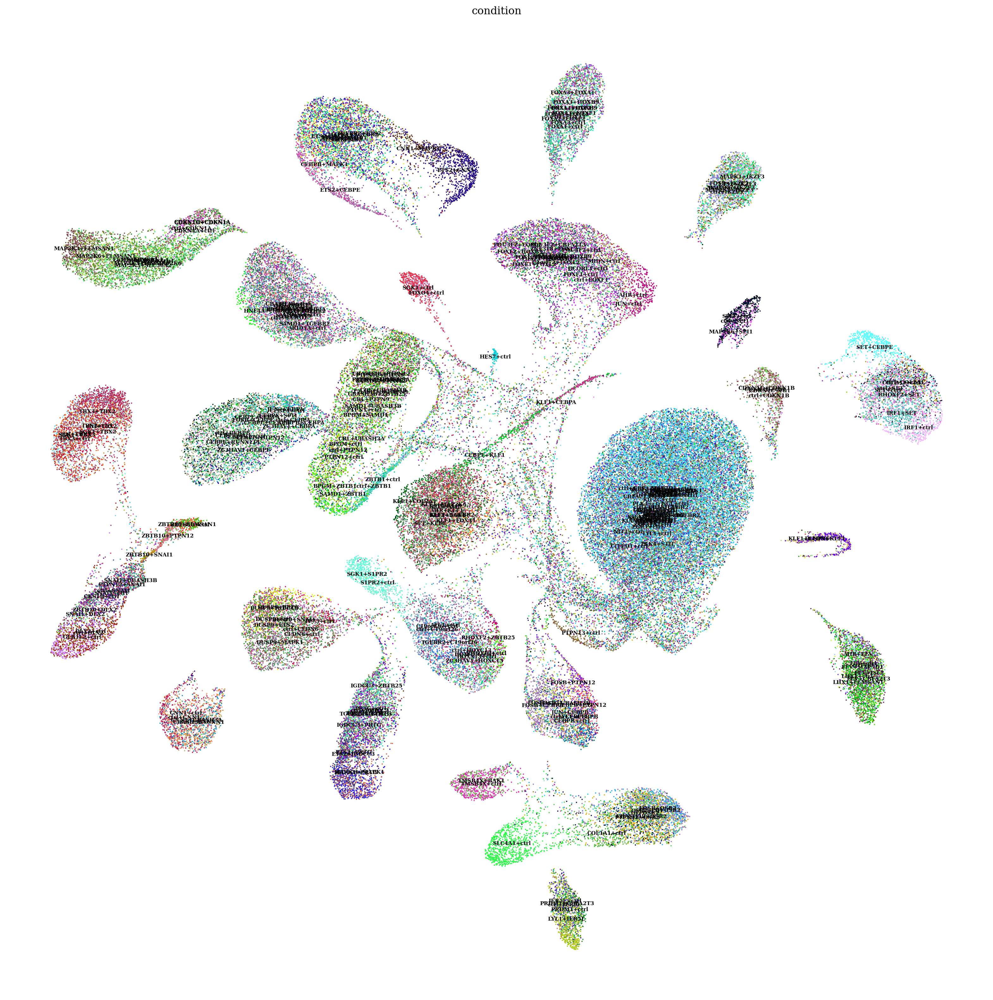

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

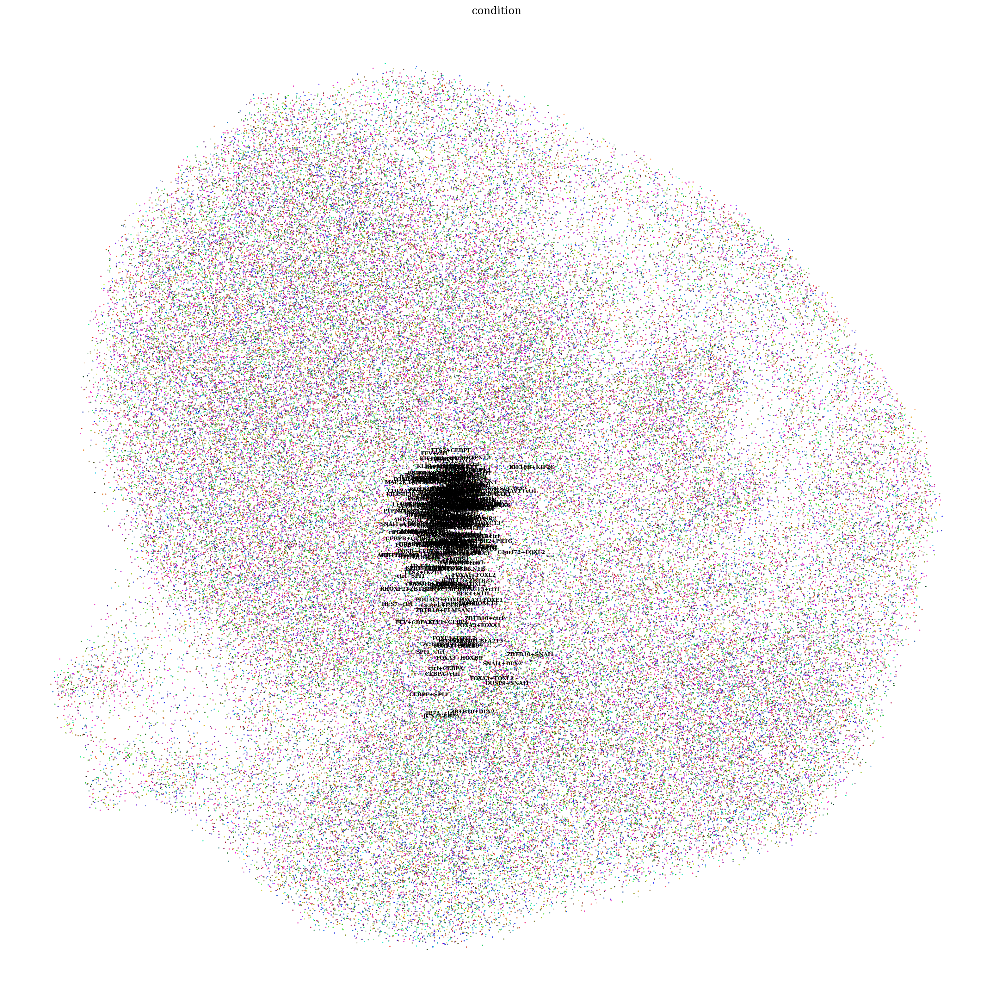

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()